In [ ]:
import os
import librosa
import joblib
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import soundfile as sf
from IPython.display import Audio, display
import IPython.display as ipd

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


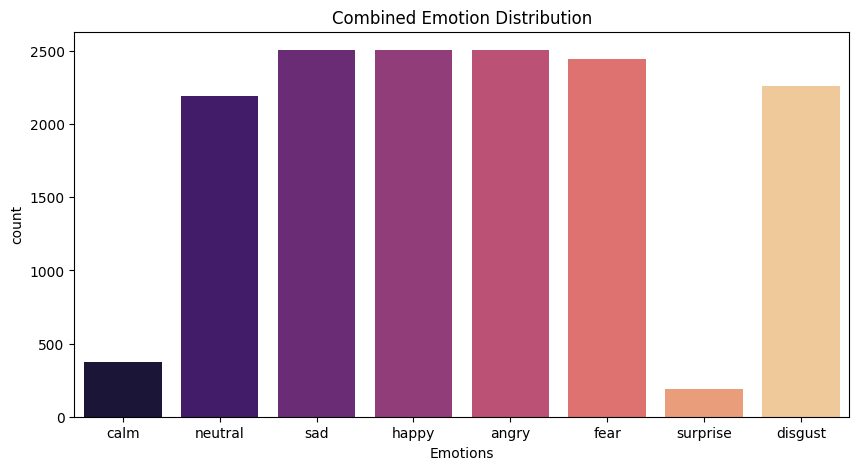

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Function to extract emotion label from filename for RAVDESS dataset
def get_emotion_ravdess(filename):
    # Extract emotion from the filename based on the provided logic
    if filename[6:8] == '01':
        return 'neutral'
    elif filename[6:8] == '02':
        return 'calm'
    elif filename[6:8] == '03':
        return 'happy'
    elif filename[6:8] == '04':
        return 'sad'
    elif filename[6:8] == '05':
        return 'angry'
    elif filename[6:8] == '06':
        return 'fear'
    elif filename[6:8] == '07':
        return 'disgust'
    elif filename[6:8] == '08':
        return 'surprise'
    else:
        return 'Unknown'

# Set the path to the RAVDESS dataset
ravdess_path = '/content/drive/My Drive/rav'

# Initialize lists to store emotions and paths
ravdess_emotions = []
ravdess_paths = []

# Get list of directories inside RAVDESS path
ravdess_directory_list = os.listdir(ravdess_path)

# Loop over the directories and audio files
for directory in ravdess_directory_list:
    if directory.startswith('Actor'):
        actor_directory = os.path.join(ravdess_path, directory)
        audio_files = os.listdir(actor_directory)
        for file in audio_files:
            emotion = get_emotion_ravdess(file)
            if emotion != 'Unknown':
                ravdess_emotions.append(emotion)
                ravdess_paths.append(os.path.join(actor_directory, file))

# Create DataFrame for RAVDESS data
ravdess_df = pd.DataFrame({'Emotions': ravdess_emotions, 'Path': ravdess_paths})


# Function to extract emotion label from filename for CREMA-D dataset
def get_emotion_crema(filename):
    return filename.split('_')[2]

# Set the path to the CREMA-D subset
crema_path = '/content/drive/My Drive//crema_d/AudioWAV'

# Initialize lists to store emotions and paths
crema_emotions = []
crema_paths = []

# Loop over the files in CREMA-D subset
for root, dirs, files in os.walk(crema_path):
    for file_name in files:
        emotion = get_emotion_crema(file_name)
        crema_emotions.append(emotion)
        crema_paths.append(os.path.join(root, file_name))

# Create DataFrame for CREMA-D data
crema_df = pd.DataFrame({'Emotions': crema_emotions, 'Path': crema_paths})


# Function to extract emotion label from filename for TESS dataset
def get_emotion_tess(filename):
    if 'angry' in filename:
        return 'angry'
    elif 'happy' in filename:
        return 'happy'
    elif 'neutral' in filename:
        return 'neutral'
    elif 'sad' in filename:
        return 'sad'
    elif 'surprise' in filename:
        return 'surprise'
    elif 'fear' in filename:
        return 'fear'
    elif 'disgust' in filename:
        return 'disgust'
    else:
        return 'Unknown'

# Set the path to the TESS dataset
tess_path = '/content/drive/My Drive/tess/TESS Toronto emotional speech set data/'

# Initialize lists to store emotions and paths
tess_emotions = []
tess_paths = []

# Loop over the files in TESS dataset
for root, dirs, files in os.walk(tess_path):
    for file_name in files:
        emotion = get_emotion_tess(file_name)
        tess_emotions.append(emotion)
        tess_paths.append(os.path.join(root, file_name))

# Create DataFrame for TESS data
tess_df = pd.DataFrame({'Emotions': tess_emotions, 'Path': tess_paths})
tess_df = tess_df[tess_df['Emotions'] != 'Unknown']

# Define a dictionary for emotion codes
temp_dict = {"SAD": "sad", "ANG": "angry", "DIS": "disgust", "FEA": "fear", "HAP": "happy", "NEU": "neutral"}

# Use map function to update emotions in CREMA-D dataset
crema_df['Emotions'] = crema_df['Emotions'].map(temp_dict)

# SAVEE - 480
SAVEE = "/content/drive/My Drive/resampled_data/savee/ALL/"
# Get the data location for SAVEE
dir_list = os.listdir(SAVEE)

# parse the filename to get the emotions
emotion = []
path = []
for i in dir_list:
    if i[-8:-6] == '_a':
        emotion.append('angry')
    elif i[-8:-6] == '_h':
        emotion.append('happy')
    elif i[-8:-6] == '_n':
        emotion.append('neutral')
    elif i[-8:-6] == 'sa':
        emotion.append('sad')
    else:
        emotion.append('unknown')
    path.append(SAVEE + i)

# Create DataFrame
SAVEE_df = pd.DataFrame({'Emotions': emotion, 'Path': path})

# Filter out rows with labels not equal to 'unknown'
SAVEE_df = SAVEE_df[SAVEE_df['Emotions'] != 'unknown']


# Function to extract emotion label from filename for RAV_SONG dataset
def get_emotion_rav_song(filename):
    # Extract emotion from the filename based on the provided logic
    if filename[6:8] == '01':
        return 'neutral'
    elif filename[6:8] == '02':
        return 'calm'
    elif filename[6:8] == '03':
        return 'happy'
    elif filename[6:8] == '04':
        return 'sad'
    elif filename[6:8] == '05':
        return 'angry'
    elif filename[6:8] == '06':
        return 'fear'
    elif filename[6:8] == '07':
        return 'disgust'
    elif filename[6:8] == '08':
        return 'surprise'
    else:
        return 'Unknown'

# Set the path to the RAV_SONG dataset
rav_song_path = '/content/drive/My Drive/rav_song'

# Initialize lists to store emotions and paths for RAV_SONG
rav_song_emotions = []
rav_song_paths = []

# Get list of directories inside RAV_SONG path
rav_song_directory_list = os.listdir(rav_song_path)

# Loop over the directories and audio files for RAV_SONG
for directory in rav_song_directory_list:
    if directory.startswith('Actor'):
        actor_directory = os.path.join(rav_song_path, directory)
        audio_files = os.listdir(actor_directory)
        for file in audio_files:
            emotion = get_emotion_rav_song(file)
            if emotion != 'Unknown':
                rav_song_emotions.append(emotion)
                rav_song_paths.append(os.path.join(actor_directory, file))

# Create DataFrame for RAV_SONG data
rav_song_df = pd.DataFrame({'Emotions': rav_song_emotions, 'Path': rav_song_paths})

# Concatenate the dataframes for RAV_SONG, RAVDESS, CREMA-D, TESS, SAVEE
combined_df = pd.concat([rav_song_df, ravdess_df, crema_df, tess_df, SAVEE_df], ignore_index=True)

# Plot the value counts for each emotion in combined_df
plt.figure(figsize=(10, 5))
sns.countplot(data=combined_df, x='Emotions', palette='magma')
plt.title('Combined Emotion Distribution')
plt.show()


In [ ]:
print(os.path.exists('/content/drive/My Drive/rav/Actor_07/03-01-04-01-01-01-07.wav'))

True


In [ ]:
# Drop 'calm' and 'surprise' emotions from combined_df
combined_df = combined_df[~combined_df['Emotions'].isin(['calm', 'surprise'])]

# Count the number of emotions in the updated combined dataframe
emotion_counts = combined_df['Emotions'].value_counts()
print(emotion_counts)

happy      2507
angry      2507
sad        2505
fear       2447
disgust    2263
neutral    2195
Name: Emotions, dtype: int64


In [ ]:
# Define the number of samples you want for each emotion (use the minimum count among all emotions)
min_samples = emotion_counts.min()

# Create a list to store the balanced dataframes
balanced_dfs = []

# Group the dataframe by emotion
grouped_df = combined_df.groupby('Emotions')

# Sample the minimum number of samples for each emotion with replacement
for emotion, group in grouped_df:
    balanced_dfs.append(group.sample(min_samples, replace=True, random_state=42))

# Concatenate the balanced dataframes to overwrite the existing dataframe
combined_df = pd.concat(balanced_dfs, ignore_index=True)

# Check the new distribution
emotion_counts_after_balance = combined_df['Emotions'].value_counts()
print(emotion_counts_after_balance)

angry      2195
disgust    2195
fear       2195
happy      2195
neutral    2195
sad        2195
Name: Emotions, dtype: int64


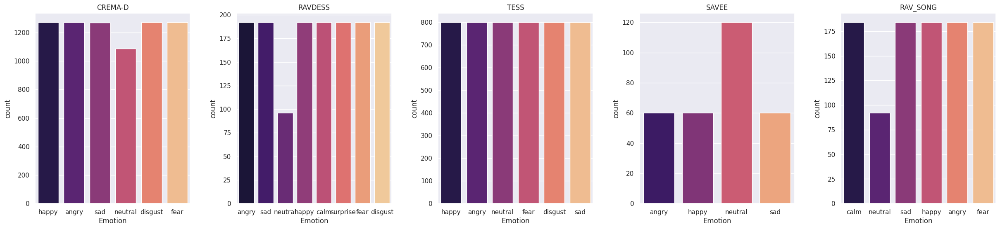

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of the plots
sns.set(style="darkgrid")

# Create a figure with wider size
fig, axes = plt.subplots(1, 5, figsize=(30, 6))  # Adjust the number of subplots to match  needs

# Plot the value counts for each emotion in crema_df
sns.countplot(data=crema_df, x='Emotions', palette='magma', ax=axes[0])
axes[0].set_title('CREMA-D')
axes[0].set_xlabel('Emotion')

# Plot the value counts for each emotion in ravdess_df
sns.countplot(data=ravdess_df, x='Emotions', palette='magma', ax=axes[1])
axes[1].set_title('RAVDESS')
axes[1].set_xlabel('Emotion')

# Plot the value counts for each emotion in tess_df
sns.countplot(data=tess_df, x='Emotions', palette='magma', ax=axes[2])
axes[2].set_title('TESS')
axes[2].set_xlabel('Emotion')

# Plot the value counts for each emotion in SAVEE_df
sns.countplot(data=SAVEE_df, x='Emotions', palette='magma', ax=axes[3])
axes[3].set_title('SAVEE')
axes[3].set_xlabel('Emotion')

# Plot the value counts for each emotion in rav_song_df
sns.countplot(data=rav_song_df, x='Emotions', palette='magma', ax=axes[4])
axes[4].set_title('RAV_SONG')
axes[4].set_xlabel('Emotion')

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.3)

# Show the plot
plt.show()

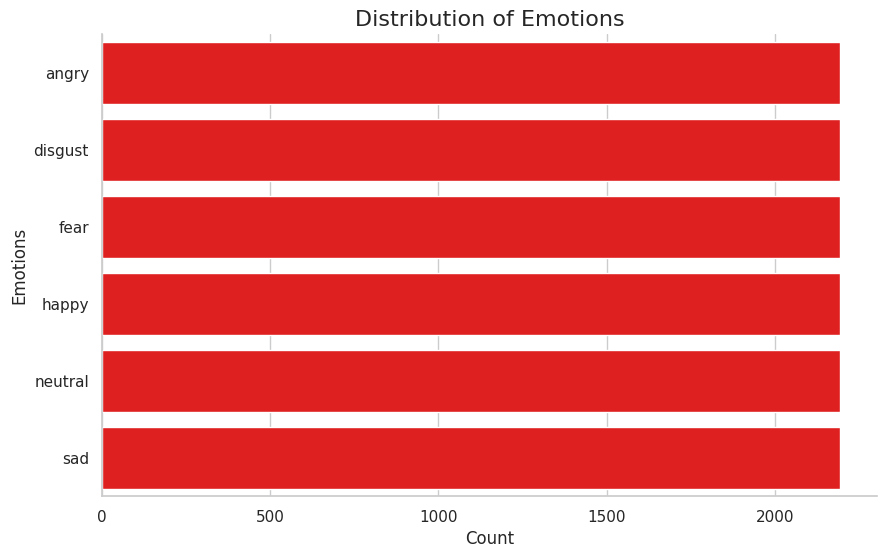

In [ ]:
# Check if it was dropped
value_counts = combined_df['Emotions'].value_counts()

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Create a horizontal bar chart with the same shade of orange for all bars
plt.figure(figsize=(10, 6))
sns.barplot(x=value_counts, y=value_counts.index, color='red')  # Use the same shade of orange for all bars

# Set labels and title
plt.xlabel('Count', size=12)
plt.ylabel('Emotions', size=12)
plt.title('Distribution of Emotions', size=16)

# This removes the spines of the plot. If you want to keep some, you can set their visibility individually
sns.despine(top=True, right=True, left=False, bottom=False)

# Display the plot
plt.show()

In [ ]:
combined_df.head()

,Emotions,Path
0,angry,/content/drive/My Drive//crema_d/AudioWAV/1066...
1,angry,/content/drive/My Drive//crema_d/AudioWAV/1023...
2,angry,/content/drive/My Drive//crema_d/AudioWAV/1036...
3,angry,/content/drive/My Drive//crema_d/AudioWAV/1033...
4,angry,/content/drive/My Drive//crema_d/AudioWAV/1006...


In [ ]:
pip install pydub

In [ ]:
from IPython.display import Audio
import IPython

# Function to play a sample audio from the specified path
def play_audio(path):
    audio = Audio(path)
    IPython.display.display(audio)

# Choose a random sample for each dataset
crema_sample = crema_df.sample(1)['Path'].values[0]
ravdess_sample = ravdess_df.sample(1)['Path'].values[0]
tess_sample = tess_df.sample(1)['Path'].values[0]
savee_sample = SAVEE_df.sample(1)['Path'].values[0]
rav_song_sample = rav_song_df.sample(1)['Path'].values[0]

# Play the samples
print("Playing a sample from CREMA-D")
play_audio(crema_sample)

print("Playing a sample from RAVDESS")
play_audio(ravdess_sample)

print("Playing a sample from TESS")
play_audio(tess_sample)

print("Playing a sample from SAVEE")
play_audio(savee_sample)

print("Playing a sample from RAV_SONG")
play_audio(rav_song_sample)


Playing a sample from CREMA-D


Playing a sample from RAVDESS


Playing a sample from TESS


Playing a sample from SAVEE


Playing a sample from RAV_SONG


# Preprocessing Functions

In [ ]:
import numpy as np
import librosa
import scipy.signal
import pandas as pd

# Preprocessing functions
def trim_silences(data, sr, top_db=35):
    """
    Trim non-speech segments from audio data and print details about trimming.

    Parameters:
    - data: numpy array, input audio data
    - sr: int, audio data sampling rate
    - top_db: float, threshold for trimming silence in decibels

    Returns:
    - Trimmed audio data
    """
    # Print details about the original data
    print(f"Original Duration: {len(data) / sr} seconds")
    print(f"Original Max Amplitude: {np.abs(data).max()}")

    # Trim the audio data
    trimmed_data, _ = librosa.effects.trim(data, top_db=top_db)

    # Print details about the trimmed data
    print(f"Trimmed Duration: {len(trimmed_data) / sr} seconds")
    print(f"Trimmed Max Amplitude: {np.abs(trimmed_data).max()}")

    return trimmed_data


def normalize_audio(audio):
    """
    Normalize audio data to the range [-1, 1] and print details about the normalization.

    Parameters:
    - audio: numpy array, input audio data

    Returns:
    - Normalized audio data
    """
    original_max = np.abs(audio).max()

    # Ensure audio is in float32 format
    audio = audio.astype(np.float32)

    # Perform clip normalization
    normalized_audio = np.clip(audio / original_max, -1.0, 1.0)

    # Print details about data distribution
    print(f"Original Max: {original_max}")
    print(f"Normalized Max: {np.abs(normalized_audio).max()}")
    return normalized_audio

In [ ]:
import matplotlib.pyplot as plt
import librosa.display

def create_waveplot(data, sr, emotion):
    """
    Generate and display a waveplot for audio data.

    Parameters:
    - data: numpy array, input audio data
    - sr: int, audio data sampling rate
    - emotion: str, emotion label for the plot title
    """
    plt.figure(figsize=(10, 3))

    # Plot the waveform with specified color, alpha, and background
    librosa.display.waveshow(data, sr=sr, color='purple', alpha=0.8)

    # Set plot title
    plt.title(f'Waveplot for audio with {emotion} emotion', size=15)

    # Set x and y axis labels
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    # Add grid with specified style
    plt.grid(True, linestyle='--', linewidth=1, color='black', alpha=0.7)

    # Show the plot
    plt.show()


def create_spectrogram(data, sr, emotion):
    """
    Generate and display a nicer spectrogram for audio data.

    Parameters:
    - data: numpy array, input audio data
    - sr: int, audio data sampling rate
    - emotion: str, emotion label for the plot title
    """
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))

    plt.figure(figsize=(12, 5))
    plt.title(f'Spectrogram for audio with {emotion} emotion', size=15)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz', cmap='viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.xlabel('Time (seconds)', fontsize=12)
    plt.ylabel('Frequency (Hz)', fontsize=12)
    plt.tick_params(axis='both', labelsize=10)
    plt.tight_layout()
    plt.show()


## Test Function

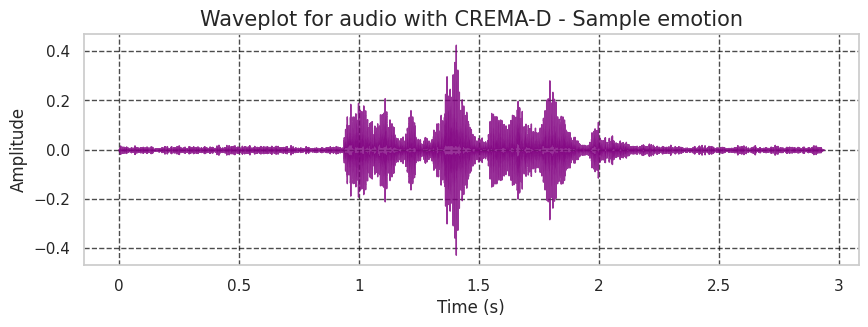

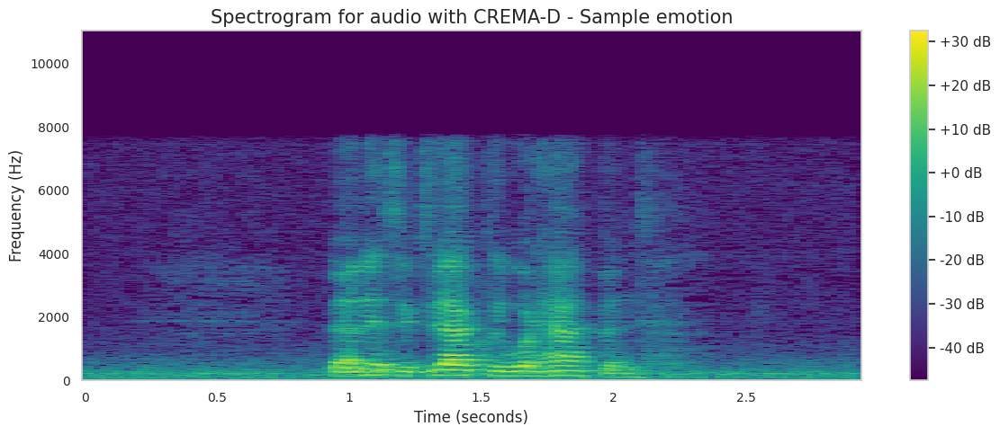

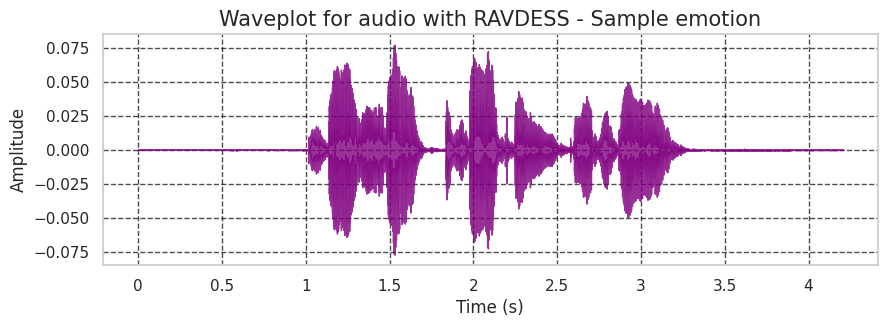

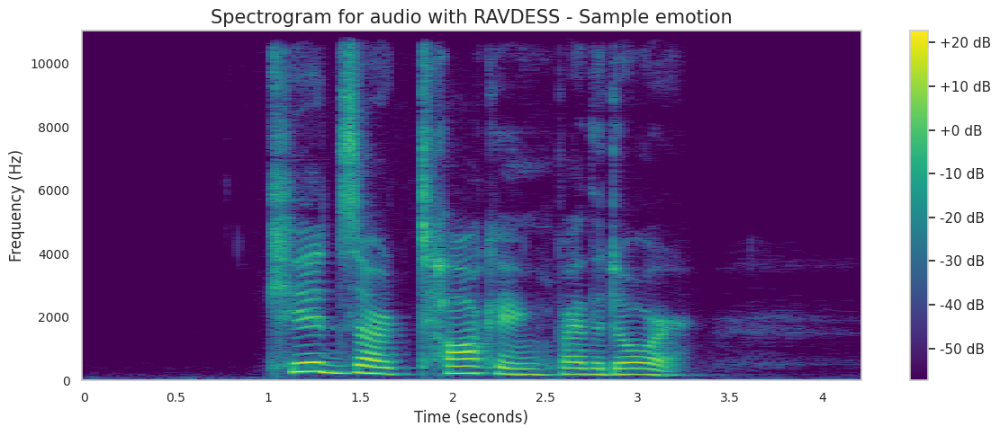

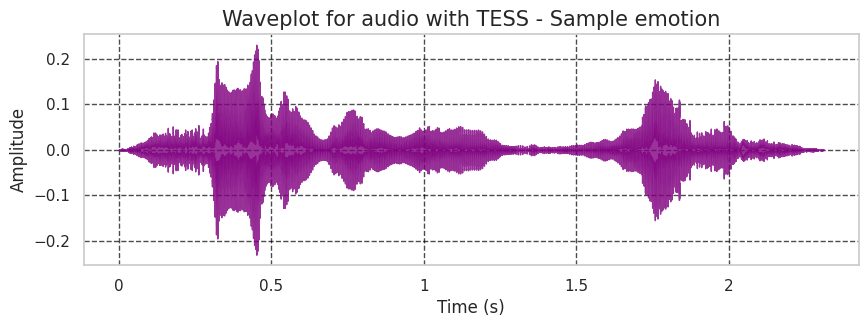

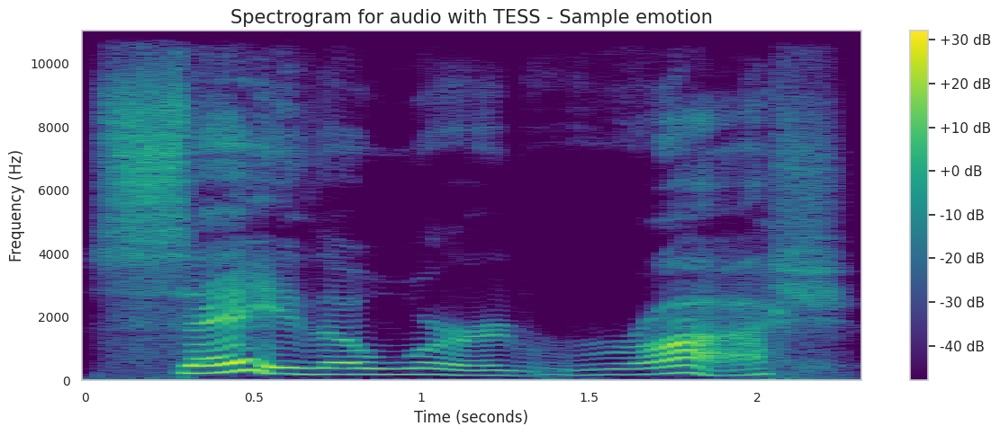

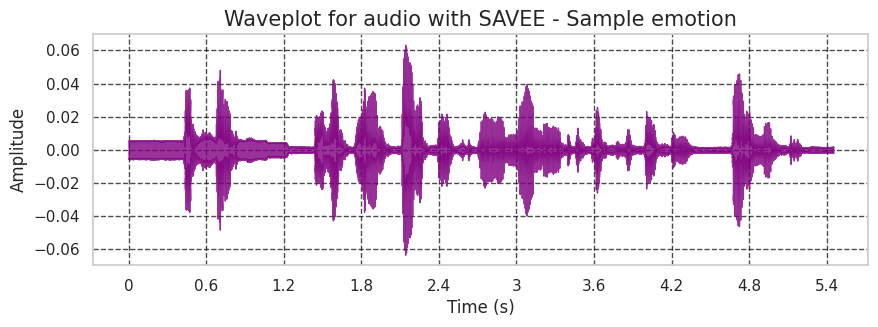

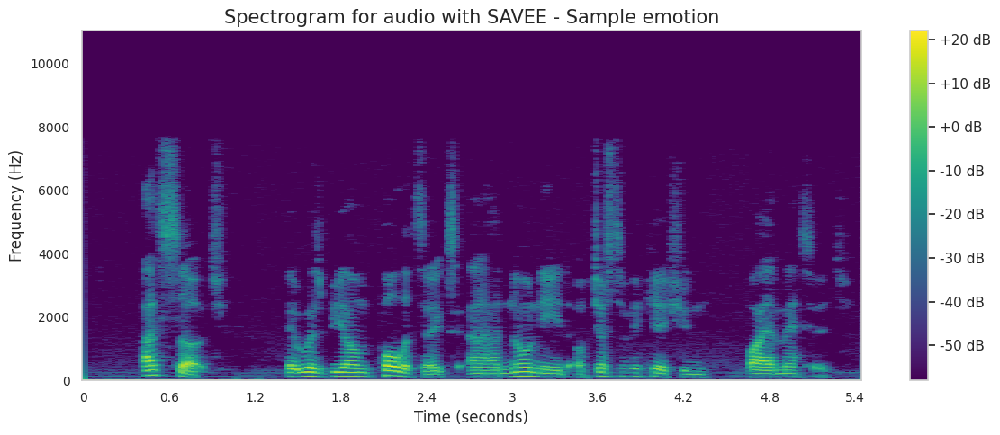

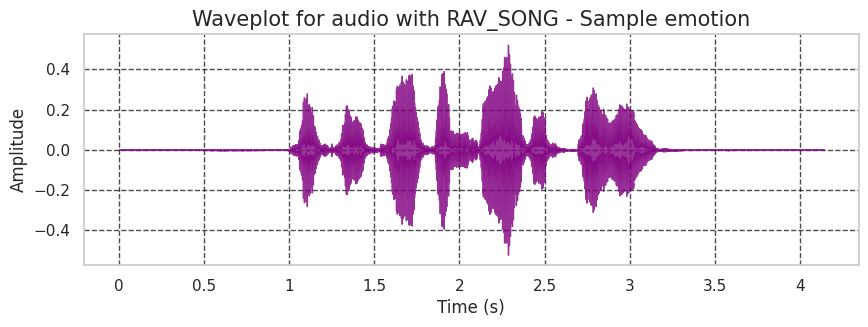

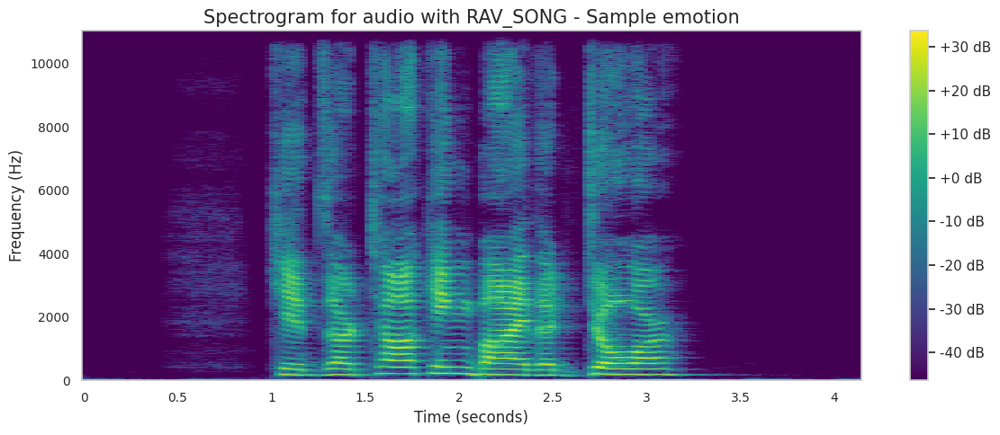

In [ ]:
# Function to display audio analysis for a sample from each dataset
def display_sample_analysis(df, dataset_name):
    sample_path = df.sample(1)['Path'].values[0]
    audio_data, sr = librosa.load(sample_path)

    create_waveplot(audio_data, sr, f'{dataset_name} - Sample')
    create_spectrogram(audio_data, sr, f'{dataset_name} - Sample')

# Display a sample for each dataset
display_sample_analysis(crema_df, 'CREMA-D')
display_sample_analysis(ravdess_df, 'RAVDESS')
display_sample_analysis(tess_df, 'TESS')
display_sample_analysis(SAVEE_df, 'SAVEE')
display_sample_analysis(rav_song_df, 'RAV_SONG')

In [ ]:
emotions = ['neutral', 'happy', 'sad', 'angry', 'fear', 'disgust']

for emotion in emotions:
    # Get the path for the chosen emotion from the combined dataframe
    path = combined_df.loc[combined_df['Emotions'] == emotion, 'Path'].values
    if len(path) > 0 and not pd.isna(path[1139]):
        path = path[0]
        data, sr = sf.read(path)

        # If the audio is stereo, average the channels
        if len(data.shape) > 1:
            data = np.mean(data, axis=1)

        # Normalize audio
        normalized_data = normalize_audio(data)

        # Trim silences
        trimmed_data = trim_silences(normalized_data, sr)

        # Display original audio
        print(f"Original Audio Playback for {emotion}")
        display(Audio(normalized_data, rate=sr))

        # Display trimmed audio
        print(f"Trimmed Audio Playback for {emotion}")
        display(Audio(trimmed_data, rate=sr))

    else:
        print(f"No audio file found for {emotion}")


Original Max: 0.1444091796875
Normalized Max: 1.0
Original Duration: 2.602625 seconds
Original Max Amplitude: 1.0
Trimmed Duration: 2.602625 seconds
Trimmed Max Amplitude: 1.0
Original Audio Playback for neutral


Trimmed Audio Playback for neutral


Original Max: 0.215484619140625
Normalized Max: 1.0
Original Duration: 2.002 seconds
Original Max Amplitude: 1.0
Trimmed Duration: 2.002 seconds
Trimmed Max Amplitude: 1.0
Original Audio Playback for happy


Trimmed Audio Playback for happy


Original Max: 0.062774658203125
Normalized Max: 1.0
Original Duration: 2.002 seconds
Original Max Amplitude: 1.0
Trimmed Duration: 2.002 seconds
Trimmed Max Amplitude: 1.0
Original Audio Playback for sad


Trimmed Audio Playback for sad


Original Max: 1.0
Normalized Max: 1.0
Original Duration: 1.7684375 seconds
Original Max Amplitude: 1.0
Trimmed Duration: 1.568 seconds
Trimmed Max Amplitude: 1.0
Original Audio Playback for angry


Trimmed Audio Playback for angry


Original Max: 0.13787841796875
Normalized Max: 1.0
Original Duration: 2.2689375 seconds
Original Max Amplitude: 1.0
Trimmed Duration: 2.2689375 seconds
Trimmed Max Amplitude: 1.0
Original Audio Playback for fear


Trimmed Audio Playback for fear


Original Max: 0.100921630859375
Normalized Max: 1.0
Original Duration: 2.102125 seconds
Original Max Amplitude: 1.0
Trimmed Duration: 2.102125 seconds
Trimmed Max Amplitude: 1.0
Original Audio Playback for disgust


Trimmed Audio Playback for disgust


Streaming output truncated to the last 5000 lines.
Original Max: 0.026763916015625
Normalized Max: 1.0
Original Duration: 2.8361875 seconds
Original Max Amplitude: 1.0
Trimmed Duration: 2.8361875 seconds
Trimmed Max Amplitude: 1.0
Original Max: 0.37860107421875
Normalized Max: 1.0
Original Duration: 1.6716228393544688 seconds
Original Max Amplitude: 1.0
Trimmed Duration: 1.65065126566724 seconds
Trimmed Max Amplitude: 1.0
Original Max: 0.346435546875
Normalized Max: 1.0
Original Duration: 1.897313017121324 seconds
Original Max Amplitude: 1.0
Trimmed Duration: 1.8664700581633489 seconds
Trimmed Max Amplitude: 1.0
Original Max: 0.999969482421875
Normalized Max: 1.0
Original Duration: 2.7360625 seconds
Original Max Amplitude: 1.0
Trimmed Duration: 2.016 seconds
Trimmed Max Amplitude: 1.0
Original Max: 0.672210693359375
Normalized Max: 1.0
Original Duration: 3.970625 seconds
Original Max Amplitude: 1.0
Trimmed Duration: 1.9946666666666666 seconds
Trimmed Max Amplitude: 1.0
Original Max: 0.

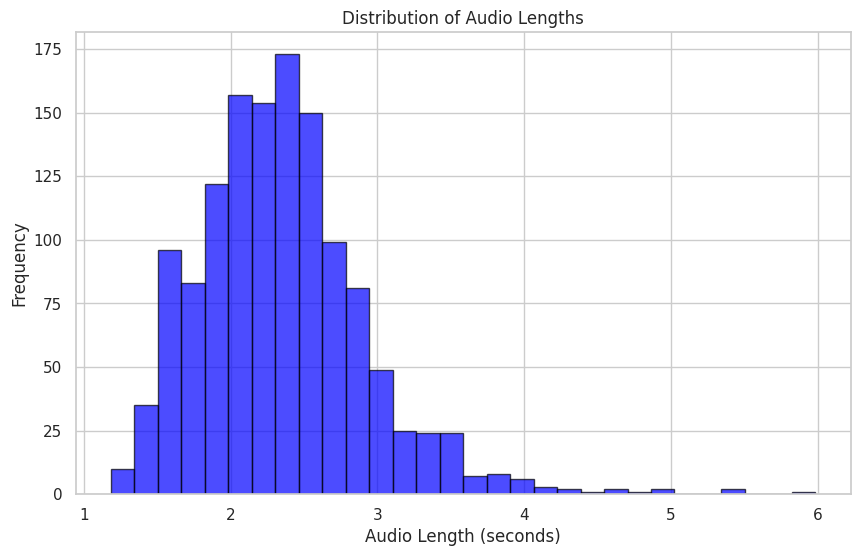

In [ ]:
import soundfile as sf
import matplotlib.pyplot as plt

#  'combined_df' is  DataFrame with a 'Path' column

# Take a 10% sample of paths
sample_size = int(0.1 * len(combined_df))
sample_paths = combined_df.sample(n=sample_size)['Path']

# Initialize lists to store lengths
lengths = []

# Iterate through sampled paths
for path in sample_paths:
    if not pd.isna(path):
        data, sr = sf.read(path)

        # If the audio is stereo, average the channels
        if len(data.shape) > 1:
            data = np.mean(data, axis=1)

        # Normalize audio
        normalized_data = normalize_audio(data)

        # Trim silences
        trimmed_data = trim_silences(normalized_data, sr)

        # Append length to the list
        lengths.append(len(trimmed_data) / sr)

# Calculate and print average and maximum lengths
average_length = np.mean(lengths)
max_length = np.max(lengths)

print(f"Average Length of the sampled audio files: {average_length:.2f} seconds")
print(f"Maximum Length of the sampled audio files: {max_length:.2f} seconds")

# Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(lengths, bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Distribution of Audio Lengths')
plt.xlabel('Audio Length (seconds)')
plt.ylabel('Frequency')
plt.show()

# Augmentation

In [ ]:
import numpy as np

# Example usage
path = np.array(combined_df.Path)[200]  # Replace this with  actual audio file path
background_noise_path = '/content/drive/My Drive/Background/applause.wav'

from IPython.display import Audio

# Example usage
applause_path = '/content/drive/My Drive/Background/applause.wav'

# Display the applause audio
Audio(applause_path, autoplay=True)


## Custom Augmentions for Politics

Echo Effect (add_echo function):
Relevance to Political Speeches: The echo effect can add a sense of authority and resonance to political speeches, making them sound more impactful. It can create a feeling of grandeur and importance, which might be suitable for certain political contexts. However, the appropriateness depends on the specific tone and style desired for the speech.

Background Noise Addition (add_background_noise function):
Relevance to Political Speeches: Adding background noise can simulate the ambiance of a large auditorium or public gathering, providing a sense of realism. It might be useful for creating a more immersive experience for listeners, making them feel like they are part of a live event. Additionally, background noise can be manipulated to evoke specific atmospheres, such as a crowded rally or a formal conference.

Reverb Effect (add_reverb function):

Relevance to Political Speeches: Adding reverb can create a sense of spaciousness and authority, making it suitable for speeches in large venues or open spaces. It can enhance the perceived importance of the speaker and contribute to a more compelling and captivating delivery. However, it's essential to use reverb judiciously, as excessive reverb may reduce speech intelligibility.

In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio
from pydub import AudioSegment
from pydub.generators import WhiteNoise

import numpy as np

def add_echo(data, sampling_rate, delay_range=(0.1, 0.4), decay=0.5):
    """
    Add echo effect to the audio data.

    Parameters:
    - data: numpy array, input audio data
    - sampling_rate: int, audio data sampling rate
    - delay_range: tuple of floats, range of delay in seconds (e.g., (0.1, 0.4))
    - decay: float, decay factor for the echo effect

    Returns:
    - Audio data with echo effect
    """
    # Generate a random delay within the specified range
    delay = np.random.uniform(delay_range[0], delay_range[1])
    # Compute the number of samples for the delay
    delay_samples = int(delay * sampling_rate)
    # Create an echo signal by shifting the data and applying decay
    echo = np.concatenate((np.zeros(delay_samples), data[:-delay_samples] * decay))
    # Mix the original signal with the echo
    mixed_data = data + echo

    return mixed_data

def add_background_noise(data, background_noise_path, noise_level=1.35):
    # Load background noise audio
    background_noise, _ = librosa.load(background_noise_path, sr=None, duration=3)

    # Ensure the background noise duration matches the input data duration
    if len(background_noise) < len(data):
        raise ValueError("Background noise duration is shorter than the input data duration")

    # Trim or pad the background noise to match the length of the input data
    if len(background_noise) > len(data):
        background_noise = background_noise[:len(data)]
    else:
        background_noise = np.pad(background_noise, (0, len(data) - len(background_noise)))

    # Adjust the amplitude of the background noise
    noise_amp = noise_level * np.random.uniform() * np.amax(data)
    background_noise = background_noise * noise_amp / np.max(background_noise)

    # Mix the background noise with the original data
    mixed_data = data + background_noise

    return mixed_data

def match_duration(audio, target_duration, sr):
    target_length = int(target_duration * sr)
    if len(audio) < target_length:
        # Repeat the audio to match the target duration
        repeats = target_length // len(audio) + 1
        audio = np.tile(audio, repeats)[:target_length]
    elif len(audio) > target_length:
        # Trim the audio to match the target duration
        audio = audio[:target_length]
    return audio

def match_length(audio, target_length):
    if len(audio) < target_length:
        # Repeat the audio to match the target length
        repeats = target_length // len(audio) + 1
        audio = np.tile(audio, repeats)[:target_length]
    elif len(audio) > target_length:
        # Trim the audio to match the target length
        audio = audio[:target_length]
    return audio

def add_reverb(data, sample_rate, delay_factor=0.8, decay=0.8):
    # Calculate delay in samples
    delay_samples = int(delay_factor * sample_rate)

    # Create an array with delayed samples
    delayed_data = np.concatenate((np.zeros(delay_samples), data[:-delay_samples]))

    # Mix the original signal with the delayed and decayed signal
    reverb_data = data + decay * delayed_data

    return reverb_data


## Standard Augmentions which also assist In Political Speeches

In [ ]:
def stretch(data, min_rate=0.7, max_rate=1.3):
    """
    Apply time stretching to the audio data.

    Parameters:
    - data: numpy array, input audio data
    - min_rate: float, minimum stretching rate
    - max_rate: float, maximum stretching rate

    Returns:
    - Stretched audio data
    """
    # Generate a random stretching rate between min_rate and max_rate
    rate = np.random.uniform(min_rate, max_rate)
    # Apply time stretching using librosa
    return librosa.effects.time_stretch(y=data, rate=rate)

def shift(data, max_shift=500):
    """
    Apply time shifting to the audio data.

    Parameters:
    - data: numpy array, input audio data
    - max_shift: int, maximum shift range in samples

    Returns:
    - Time-shifted audio data
    """
    # Generate a random shift within the specified range
    shift_range = int(np.random.uniform(low=-max_shift, high=max_shift))
    # Apply time shifting using numpy.roll
    return np.roll(data, shift_range)

def pitch(data, sampling_rate, min_steps=-4, max_steps=1):
    """
    Apply pitch shifting to the audio data.

    Parameters:
    - data: numpy array, input audio data
    - sampling_rate: int, audio data sampling rate
    - min_steps: int, minimum pitch shift in semitones
    - max_steps: int, maximum pitch shift in semitones

    Returns:
    - Pitch-shifted audio data
    """
    # Generate a random pitch shift within the specified range
    n_steps = int(np.random.uniform(low=min_steps, high=max_steps))
    # Apply pitch shifting using librosa
    return librosa.effects.pitch_shift(data, sr=sampling_rate, n_steps=n_steps)

### Visualise the Augmentions and play on Sample Data

In [ ]:
#  'combined_df' is a DataFrame with a column named 'Path'
paths_containing_savee = combined_df[combined_df['Path'].str.contains('rav')]

# Display the first 200 rows of the resulting DataFrame
print(paths_containing_savee.head(200))

     Emotions                                               Path
8       angry  /content/drive/My Drive/rav/Actor_19/03-01-05-...
11      angry  /content/drive/My Drive/rav_song/Actor_16/03-0...
22      angry  /content/drive/My Drive/rav_song/Actor_01/03-0...
30      angry  /content/drive/My Drive/rav/Actor_08/03-01-05-...
43      angry  /content/drive/My Drive/rav/Actor_04/03-01-05-...
...       ...                                                ...
1339    angry  /content/drive/My Drive/rav_song/Actor_22/03-0...
1342    angry  /content/drive/My Drive/rav_song/Actor_07/03-0...
1348    angry  /content/drive/My Drive/rav_song/Actor_07/03-0...
1355    angry  /content/drive/My Drive/rav_song/Actor_07/03-0...
1363    angry  /content/drive/My Drive/rav/Actor_20/03-01-05-...

[200 rows x 2 columns]


File Path: /content/drive/My Drive/rav_song/Actor_22/03-02-05-01-01-01-22.wav


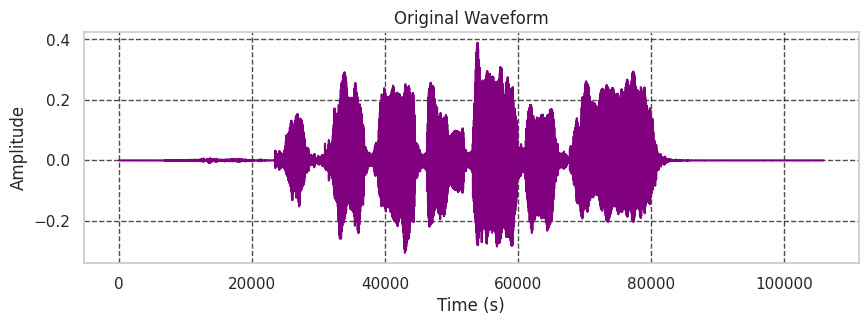

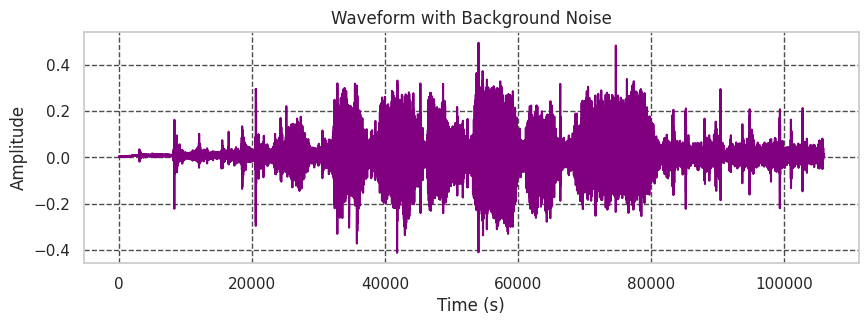

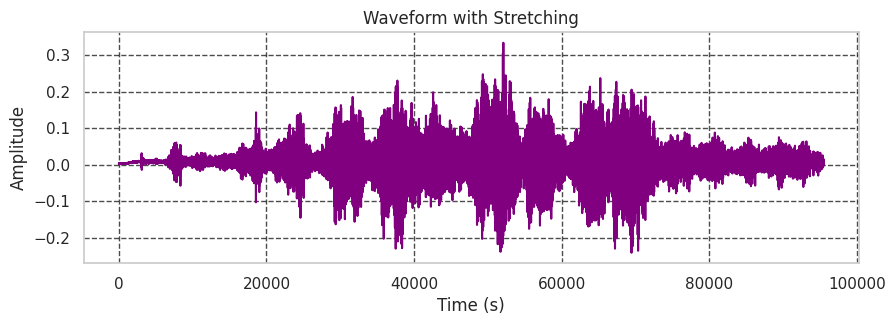

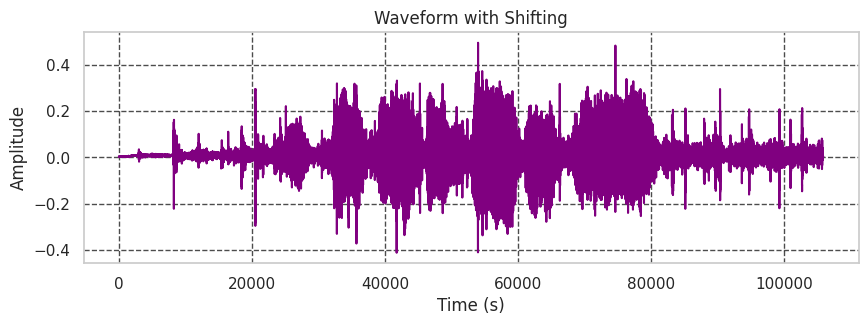

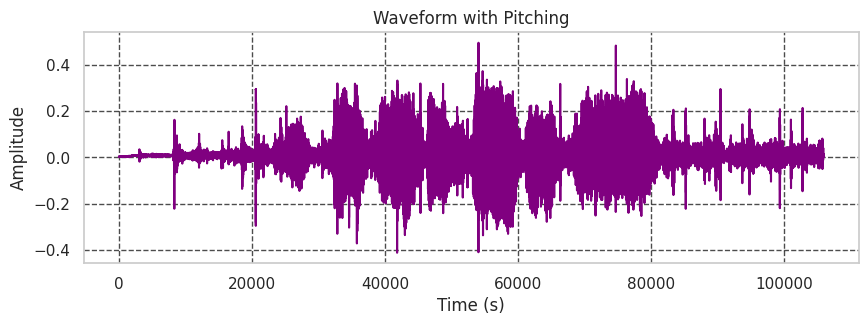

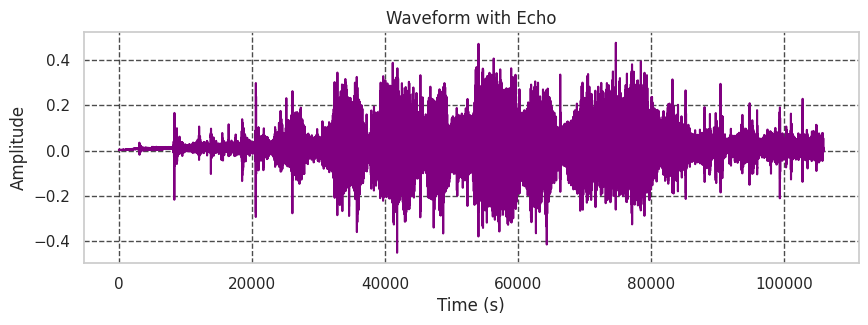

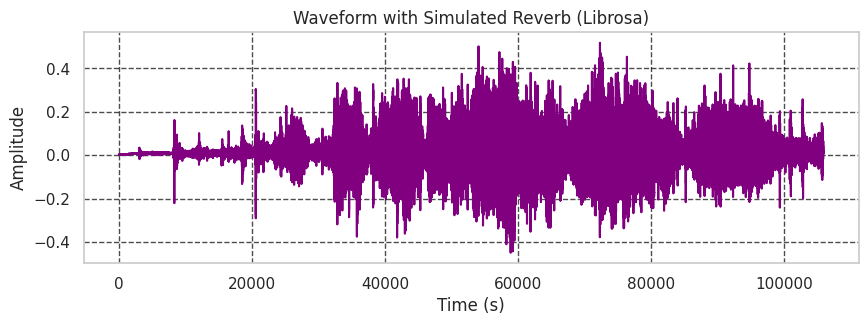

In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt

#  'combined_df' is  DataFrame with a 'Path' column
file_paths = np.array(combined_df.Path)

# Load the audio file at the specified index
path_index = 1339
path = file_paths[path_index]
print(f"File Path: {path}")

def create_waveplot(data, title):
    """
    Generate and display a waveplot for audio data.

    Parameters:
    - data: numpy array, input audio data
    - title: str, title for the plot
    """
    plt.figure(figsize=(10, 3))
    plt.plot(data, color='purple')
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True, linestyle='--', linewidth=1, color='black', alpha=0.7)
    plt.show()

# Load the audio file at the specified path
data, sample_rate = librosa.load(path, duration=7)  # Adjust duration if necessary

# Apply background noise function to the data
x = add_background_noise(data, background_noise_path)

# Apply stretching to the data
x_stretch = stretch(x)

# Apply shifting to the data
x_shift = shift(x)

# Apply pitching to the data
x_pitch = pitch(x, sample_rate)

# Apply echo to the data
x_echo = add_echo(x, sample_rate)  # Adjust the echo parameters as needed

# Apply reverb to the data
x_reverb = add_reverb(x, sample_rate)  # Adjust the reverb parameters as needed

# Plot the waveforms using the create_waveplot function with purple color
create_waveplot(data, 'Original Waveform')
create_waveplot(x, 'Waveform with Background Noise')
create_waveplot(x_stretch, 'Waveform with Stretching')
create_waveplot(x_shift, 'Waveform with Shifting')
create_waveplot(x_pitch, 'Waveform with Pitching')
create_waveplot(x_echo, 'Waveform with Echo')
create_waveplot(x_reverb, 'Waveform with Simulated Reverb (Librosa)')

In [ ]:
print("Original length:", len(data))
print("Background noise length:", len(x))
print("Stretch length:", len(x_stretch))
print("Shift length:", len(x_shift))
print("Pitch length:", len(x_pitch))
print("Echo length:", len(x_echo))
print("Reverb length:", len(x_reverb))

Original length: 105947
Background noise length: 105947
Stretch length: 95442
Shift length: 105947
Pitch length: 105947
Echo length: 105947
Reverb length: 105947


File Path: /content/drive/My Drive/rav_song/Actor_22/03-02-05-01-01-01-22.wav


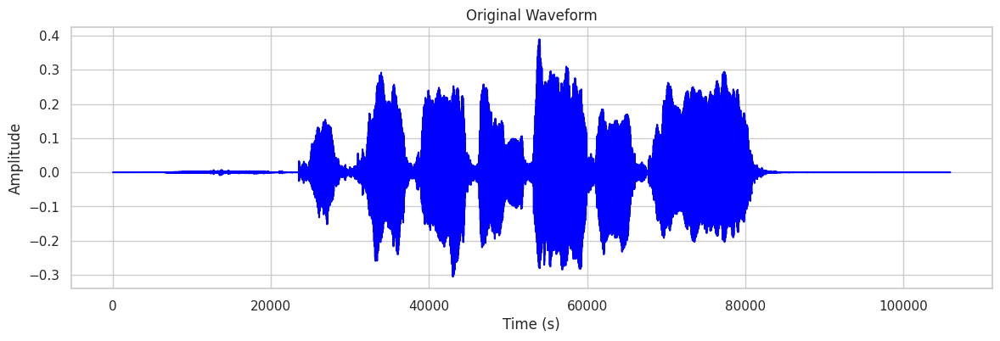

In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio

# 'combined_df' is a DataFrame with a 'Path' column
path_index = 1339  # Change the index based on requirements
file_paths = np.array(combined_df.Path)

# Load the audio file at the specified index
path = file_paths[path_index]
print(f"File Path: {path}")

# Load the original audio file without adding background noise
data, sample_rate = librosa.load(path, duration=5)  # Adjust duration if necessary

# Plot the waveform using matplotlib with blue color
plt.figure(figsize=(14, 4))
plt.plot(data, color='blue')
plt.title('Original Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Play the original audio file without background noise
Audio(data, rate=sample_rate)

In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio

# 'combined_df' is a DataFrame with a 'Path' column
path_index = 1339  # Change the index based on requirements
file_paths = np.array(combined_df.Path)

# Load the audio file at the specified index
path = file_paths[path_index]
print(f"File Path: {path}")

# Load the original audio file without adding background noise
data, sample_rate = librosa.load(path, duration=5)  # Adjust duration if necessary

# Plot the waveform using matplotlib with blue color
plt.figure(figsize=(14, 4))
plt.plot(data, color='blue')
plt.title('Original Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Play the original audio file without background noise
Audio(data, rate=sample_rate)


File Path: /content/drive/My Drive/rav_song/Actor_22/03-02-05-01-01-01-22.wav


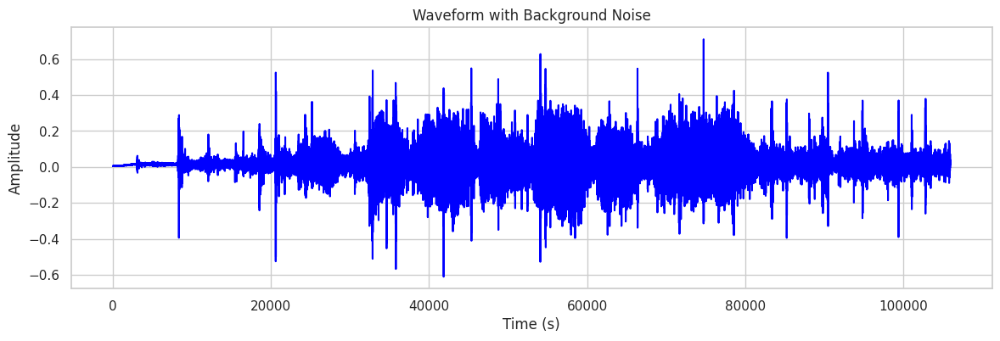

In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio

#  'combined_df' is a DataFrame with a 'Path' column
path_index = 1339  # Change the index based on  requirements
file_paths = np.array(combined_df.Path)

# Load the audio file at the specified index
path = file_paths[path_index]
print(f"File Path: {path}")

# Load the audio file
data, sample_rate = librosa.load(path, duration=5)  # Adjust duration if necessary

# Apply background noise function to the data
x = add_background_noise(data, background_noise_path=background_noise_path)

# Plot the waveform using matplotlib with blue color
plt.figure(figsize=(14, 4))
plt.plot(x, color='blue')
plt.title('Waveform with Background Noise')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Play the audio file with background noise
Audio(x, rate=sample_rate)

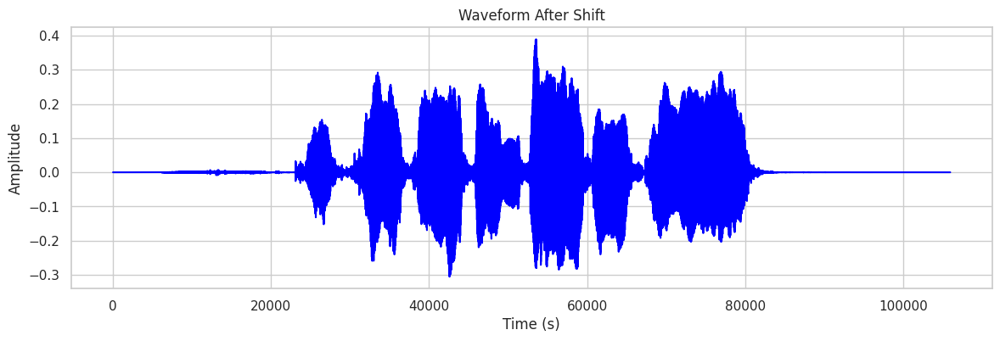

In [ ]:
# Apply shift function to the data
x = shift(data)

# Plot the waveform using matplotlib with red color
plt.figure(figsize=(14, 4))
plt.plot(x, color='blue')  # Set the color to red
plt.title("Waveform After Shift")
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Play the audio file after the shift
Audio(x, rate=sample_rate)

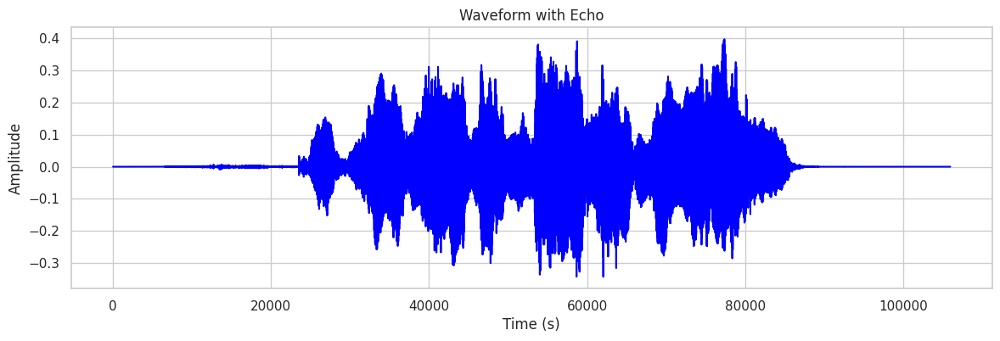

In [ ]:
# Add echo to the data
x_echo = add_echo(data, sample_rate)  # Adjust the echo parameters as needed

# Plot the waveform with echo using matplotlib with magenta color
plt.figure(figsize=(14, 4))
plt.plot(x_echo, color='blue')  # Set the color to magenta for echoed waveform
plt.title("Waveform with Echo")
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Play the audio file with echo
Audio(x_echo, rate=sample_rate)

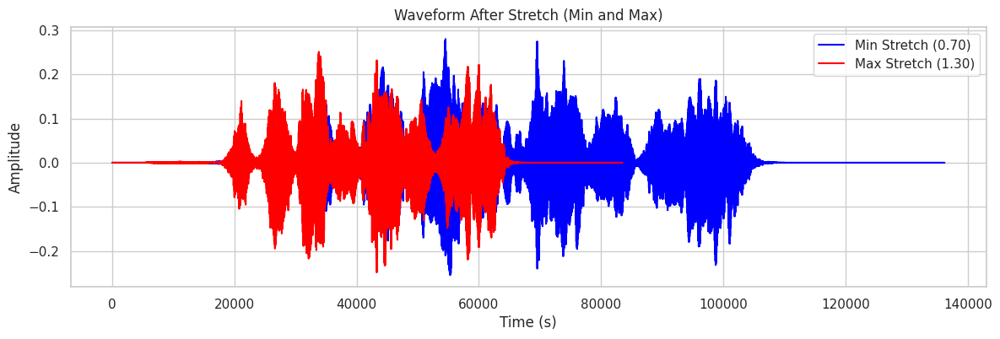

In [ ]:
# Apply stretch function to the data
min_stretch_rate = 0.7
max_stretch_rate = 1.3

x_min_stretch = stretch(data, min_rate=min_stretch_rate)
x_max_stretch = stretch(data, max_rate=max_stretch_rate)

# Plot the waveform using matplotlib
plt.figure(figsize=(14, 4))

# Plot the waveform after the minimum stretch with blue color
plt.plot(x_min_stretch, color='blue', label=f'Min Stretch ({min_stretch_rate:.2f})')

# Plot the waveform after the maximum stretch with red color
plt.plot(x_max_stretch, color='red', label=f'Max Stretch ({max_stretch_rate:.2f})')

plt.title("Waveform After Stretch (Min and Max)")
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

# Play the audio file after the minimum stretch
Audio(x_min_stretch, rate=sample_rate)

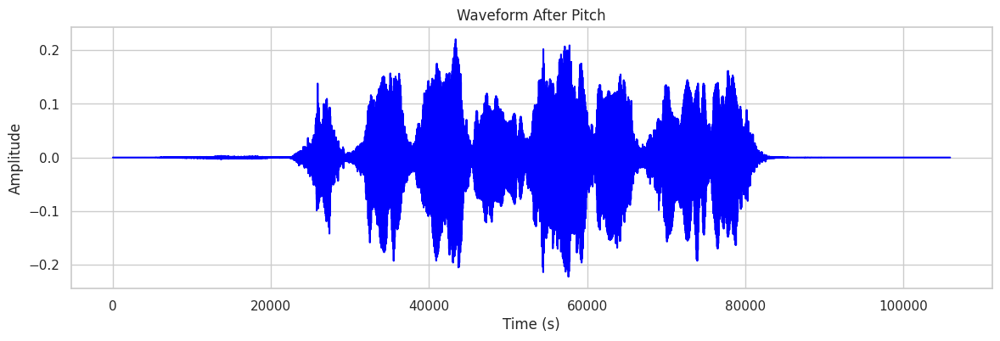

In [ ]:
# Apply pitch function to the data
x_pitch = pitch(data, sample_rate)

# Plot the waveform using matplotlib with purple color
plt.figure(figsize=(14, 4))
plt.plot(x_pitch, color='blue')  # Set the color to purple
plt.title("Waveform After Pitch")
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Play the audio file after pitch
Audio(x_pitch, rate=sample_rate)

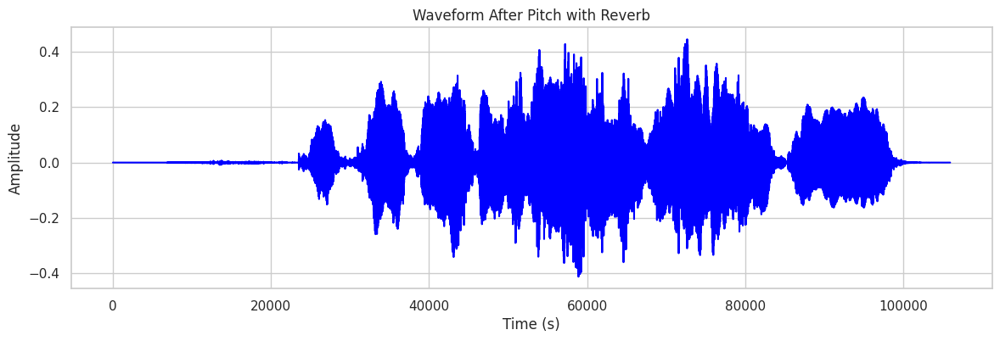

In [ ]:
# Apply pitch function to the data
x_pitch = pitch(data, sample_rate)

# Apply reverb to the pitch-shifted data
x_pitch_reverb = add_reverb(x_pitch, sample_rate)  # Adjust reverb parameters as needed

# Plot the waveform using matplotlib with cyan color
plt.figure(figsize=(14, 4))
plt.plot(x_pitch_reverb, color='blue')  # Set the color to cyan for pitch-shifted and reverberated waveform
plt.title("Waveform After Pitch with Reverb")
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Play the audio file after pitch with reverb
Audio(x_pitch_reverb, rate=sample_rate)

# Preporcessing for the Model

##Extract Features

MFCC (Mel-frequency cepstral coefficients):

MFCCs are coefficients representing the short-term power spectrum of a sound signal.
They are commonly used in speech and audio processing.
librosa.feature.mfcc computes the MFCCs.
Delta MFCC and Acceleration MFCC:

Delta MFCC represents the rate of change of the MFCC coefficients over time.
Acceleration MFCC represents the acceleration of the MFCC coefficients.
These features capture dynamic information in the audio signal.
Mel Spectrogram:

A spectrogram of an audio signal in the mel scale.
Represents the power spectrum of the signal as it varies with time.
librosa.feature.melspectrogram computes the mel spectrogram.
FRFT (Fractional Fourier Transform) Features:

FRFT is a generalization of the Fourier transform that allows for non-integer values of the transform parameter.
Here, the FRFT is computed for different alpha values (fractional orders).
Features are extracted from the real part of the FRFT result.
Spectral Centroid:

Represents the center of mass of the spectrum.
Indicates where the "center of mass" of the spectrum is located in terms of frequency.
librosa.feature.spectral_centroid computes the spectral centroid.

In [ ]:
import librosa
import numpy as np
import scipy.signal

def frft(x, alpha):
    N = len(x)
    t = np.arange(N)
    kernel = np.exp(-1j * np.pi * alpha * t**2 / N)
    return scipy.signal.fftconvolve(x, kernel, mode='same')

def extract_features(data, sample_rate):
    # Full audio feature extraction
    mfcc = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate, n_mfcc=13).T, axis=0)
    delta_mfcc = np.mean(librosa.feature.delta(mfcc).T, axis=0)
    acceleration_mfcc = np.mean(librosa.feature.delta(mfcc, order=2).T, axis=0)
    mel_spectrogram = np.mean(librosa.feature.melspectrogram(y=data, sr=sample_rate).T, axis=0)

    alpha_values = np.linspace(0.1, 0.9, 9)
    frft_features = np.array([])

    for alpha in alpha_values:
        frft_result = frft(data, alpha)
        frft_features = np.hstack((frft_features, np.mean(frft_result.real, axis=0)))

    spectral_centroid = np.mean(librosa.feature.spectral_centroid(y=data, sr=sample_rate).T, axis=0)

    return np.hstack((mfcc, delta_mfcc, acceleration_mfcc, mel_spectrogram, frft_features, spectral_centroid))

Interpretation:

Peaks or spikes in the plot may indicate moments where there is a significant change in the frequency content of the audio signal.
Trends in the plot may reveal overall patterns or characteristics of the audio, such as increasing or decreasing brightness.
In summary, the plot gives you a visual representation of how the Spectral Centroid feature varies over time in the given audio signal.

File Path: /content/drive/My Drive/tess/TESS Toronto emotional speech set data/TESS Toronto emotional speech set data/YAF_angry/YAF_juice_angry.wav


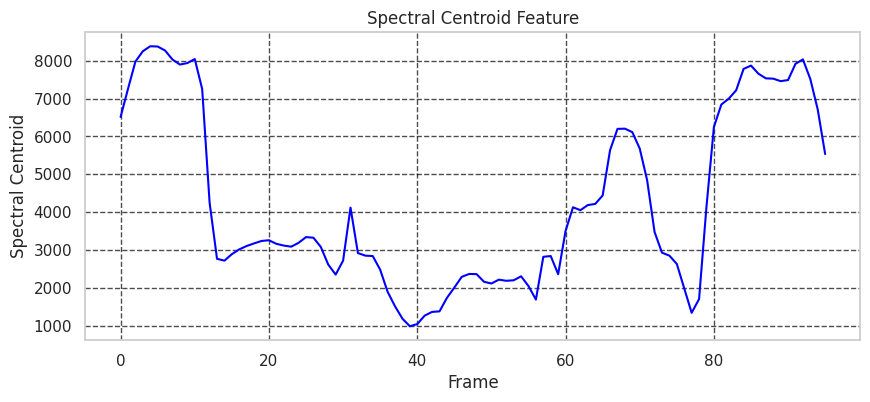

In [ ]:
import matplotlib.pyplot as plt
from IPython.display import Audio

def plot_feature(feature, title):
    plt.figure(figsize=(10, 4))
    plt.plot(feature, color='blue')
    plt.title(title)
    plt.xlabel('Frame')
    plt.ylabel('Spectral Centroid')
    plt.grid(True, linestyle='--', linewidth=1, color='black', alpha=0.7)
    plt.show()

#  'combined_df' is  DataFrame with a 'Path' column
path_index = 648  # Change the index based on  requirements
file_paths = np.array(combined_df.Path)

# Load the audio file at the specified index
path = file_paths[path_index]
print(f"File Path: {path}")

# Load the audio file at the specified path
data, sample_rate = librosa.load(path, duration=6)

# Extract the Spectral Centroid feature
spectral_centroid_feature = librosa.feature.spectral_centroid(y=data, sr=sample_rate)[0]

# Visualize the Spectral Centroid feature
plot_feature(spectral_centroid_feature, title='Spectral Centroid Feature')

# Play the audio for context
Audio(data, rate=sample_rate)

Interpretation:

Each plot represents one of the 13 MFCC coefficients extracted from the audio signal.
Patterns or variations in the plot for each coefficient can provide insights into the characteristics of the audio signal related to pitch, timbre, and other spectral features.
In summary, the set of plots gives you a visual representation of how each MFCC coefficient varies over time in the given audio signal, providing valuable information about the audio's spectral characteristics. If you have any specific questions about a particular MFCC coefficient, feel free to ask!

File Path: /content/drive/My Drive/rav_song/Actor_22/03-02-05-01-01-01-22.wav


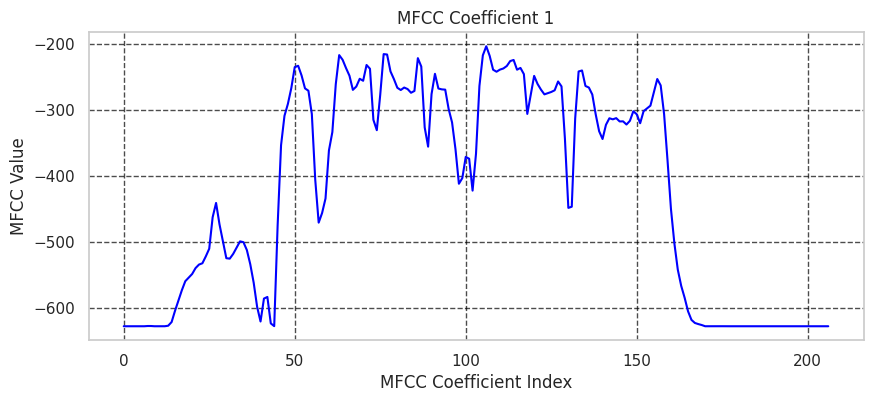

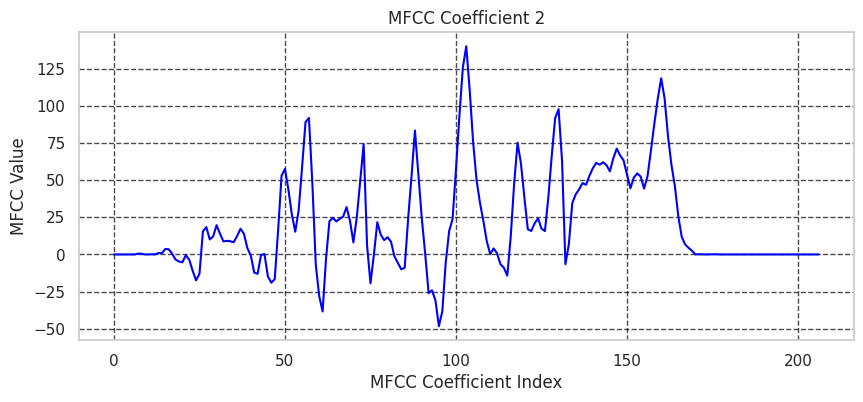

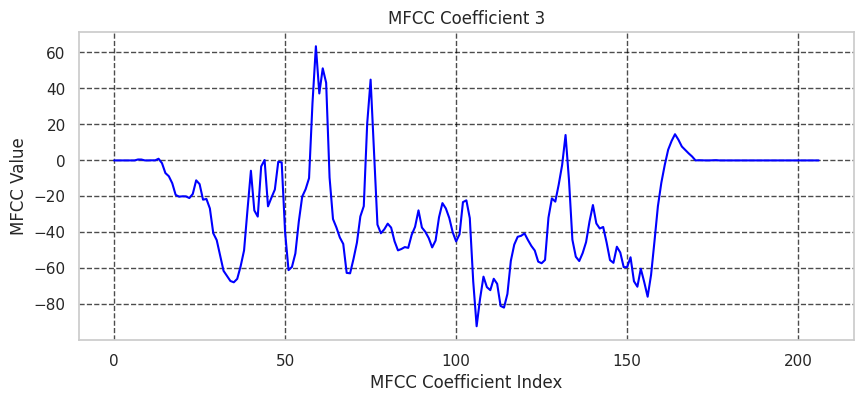

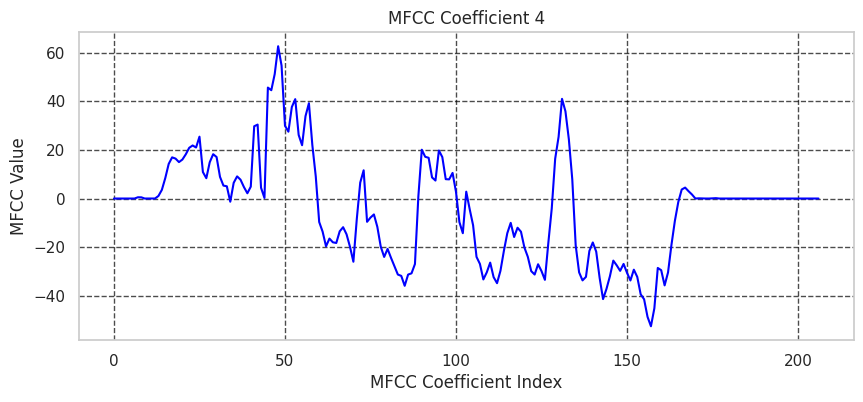

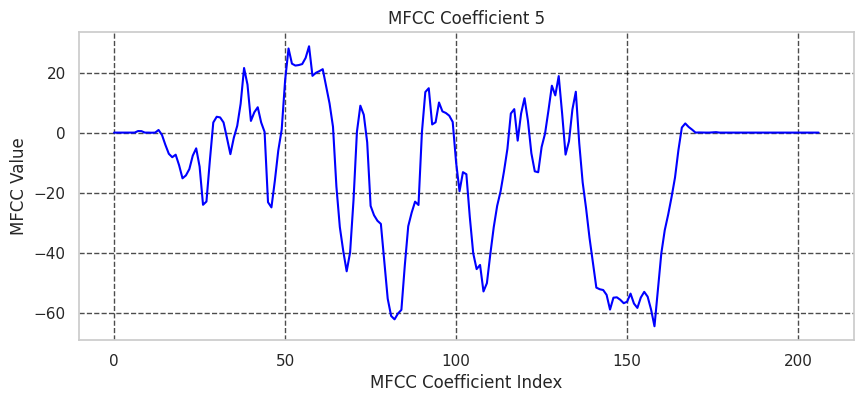

...

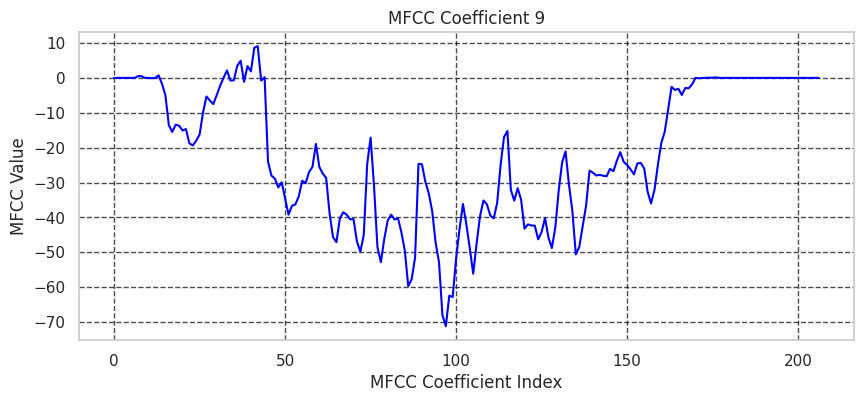

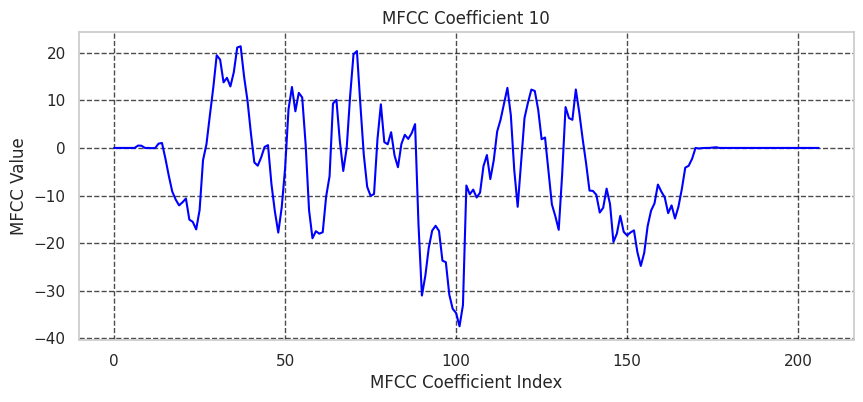

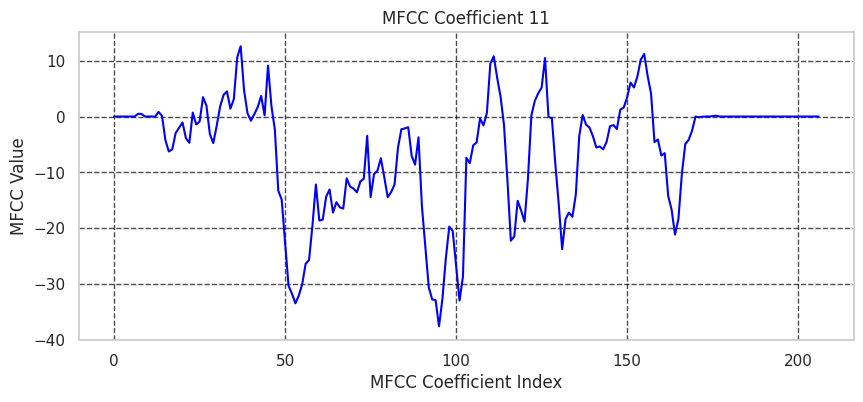

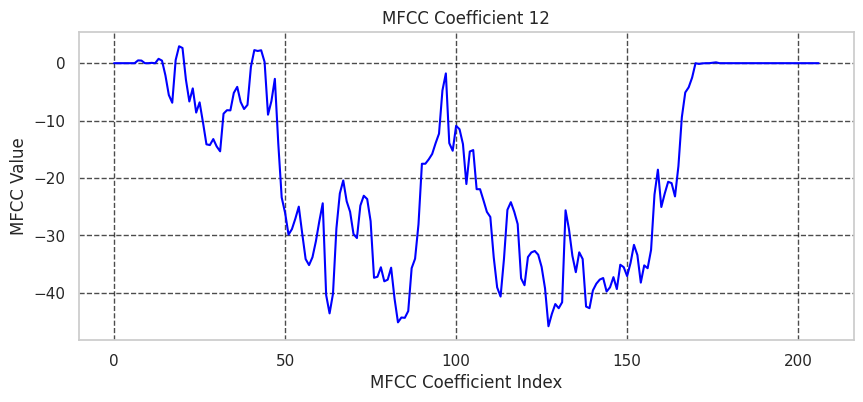

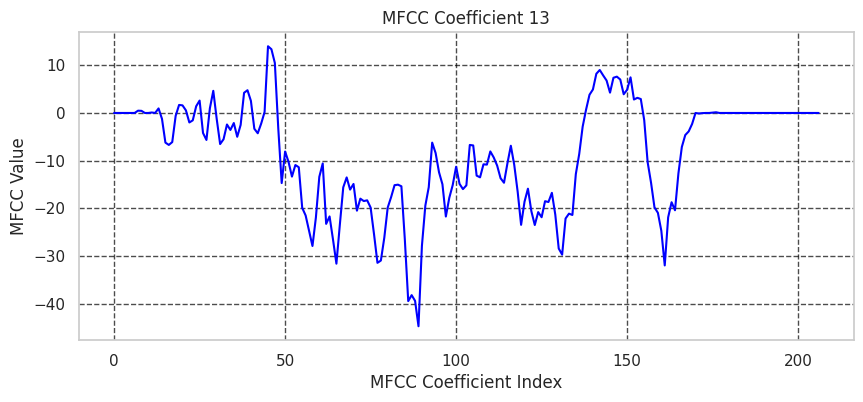

In [ ]:
import matplotlib.pyplot as plt
from IPython.display import Audio

def plot_feature(feature, title):
    plt.figure(figsize=(10, 4))
    plt.plot(feature, color='blue')
    plt.title(title)
    plt.xlabel('MFCC Coefficient Index')
    plt.ylabel('MFCC Value')
    plt.grid(True, linestyle='--', linewidth=1, color='black', alpha=0.7)
    plt.show()

# 'combined_df' is DataFrame with a 'Path' column
path = combined_df['Path'].iloc[1339]  # Change the index (e.g., 1339) based on  requirements

# Print the file path
print(f"File Path: {path}")

# Load the audio file at the specified path
data, sample_rate = librosa.load(path, duration=6)

# Extract the MFCC feature
mfcc_feature = librosa.feature.mfcc(y=data, sr=sample_rate, n_mfcc=13)

# Visualize the MFCC feature
for i in range(mfcc_feature.shape[0]):
    plot_feature(mfcc_feature[i], title=f'MFCC Coefficient {i+1}')

# Play the audio for context
Audio(data, rate=sample_rate)

## Load Features & Augmentations

In [ ]:
# Extract features from the audio
res1 = extract_features(data, sample_rate)
print("res1 shape:", res1.shape)

# Data with background noise
noise_data = add_background_noise(data, background_noise_path)
res2 = extract_features(noise_data, sample_rate)
print("res2 shape:", res2.shape)

# Data with stretching and pitching
new_data = stretch(data)
data_stretch_pitch = pitch(new_data, sample_rate)
res3 = extract_features(data_stretch_pitch, sample_rate)
print("res3 shape:", res3.shape)

# Data with shifting
shift_data = shift(data)
res4 = extract_features(shift_data, sample_rate)
print("res4 shape:", res4.shape)

# Data with echo
echo_data = add_echo(data, sample_rate)  # Adjust the echo parameters as needed
res5 = extract_features(echo_data, sample_rate)
print("res5 shape:", res5.shape)

# Data with reverb after echo
reverb_after_echo_data = add_reverb(echo_data, sample_rate)  # Adjust the reverb parameters as needed
res6 = extract_features(reverb_after_echo_data, sample_rate)
print("res6 shape:", res6.shape)

# Stack the results vertically
stacked_features = np.vstack((res1, res2, res3, res4, res5, res6))
print("Stacked features shape:", stacked_features.shape)

res1 shape: (153,)
res2 shape: (153,)
res3 shape: (153,)
res4 shape: (153,)
res5 shape: (153,)
res6 shape: (153,)
Stacked features shape: (6, 153)


In [ ]:
combined_df.head()

,Emotions,Path
0,angry,/content/drive/My Drive//crema_d/AudioWAV/1066...
1,angry,/content/drive/My Drive//crema_d/AudioWAV/1023...
2,angry,/content/drive/My Drive//crema_d/AudioWAV/1036...
3,angry,/content/drive/My Drive//crema_d/AudioWAV/1033...
4,angry,/content/drive/My Drive//crema_d/AudioWAV/1006...


## Load the Audio Data, extract Features, normalize and trim, and add augmentations

In [ ]:
def get_features(path, background_noise_path, target_sample_rate=16000, target_duration=3.0):
    try:
        # Load the audio file with the desired sample rate
        data, sample_rate = librosa.load(path, sr=target_sample_rate)

        # Trim silence on the entire duration
        try:
            trimmed_data, _ = librosa.effects.trim(data)
        except Exception as trim_error:
            raise ValueError(f"Error trimming silence for file: {path}. Error details: {str(trim_error)}")

        # Normalize the trimmed audio data
        normalized_data = normalize_audio(trimmed_data)

        # Ensure the audio is exactly 3 seconds long (truncate or pad)
        if len(normalized_data) > int(target_duration * target_sample_rate):
            normalized_data = normalized_data[:int(target_duration * target_sample_rate)]
        else:
            # Pad with zeros if the audio is shorter than 3 seconds
            pad_length = int(target_duration * target_sample_rate) - len(normalized_data)
            normalized_data = np.pad(normalized_data, (0, pad_length), 'constant')

        # Print the duration
        duration_seconds = len(normalized_data) / target_sample_rate
        print(f"Duration of {path}: {duration_seconds} seconds")

        # Initialize a list to store features
        features_list = []

        # Extract features from the entire normalized audio
        try:
            res1 = extract_features(normalized_data, sample_rate)
            features_list.append(res1)
        except Exception as feature_error:
            raise ValueError(f"Error extracting features for file: {path}. Error details: {str(feature_error)}")

        # Data with background noise
        noise_data = add_background_noise(normalized_data, background_noise_path)
        res2 = extract_features(noise_data, sample_rate)
        features_list.append(res2)

        # Data with stretching and pitching
        new_data = stretch(normalized_data)
        data_stretch_pitch = pitch(new_data, sample_rate)
        res3 = extract_features(data_stretch_pitch, sample_rate)
        features_list.append(res3)

        # Data with shifting
        shift_data = shift(normalized_data)
        res4 = extract_features(shift_data, sample_rate)
        features_list.append(res4)

        # Data with echo
        echo_data = add_echo(normalized_data, sample_rate)  # Adjust the echo parameters as needed
        res5 = extract_features(echo_data, sample_rate)
        features_list.append(res5)

        # Data with reverb after echo
        reverb_after_echo_data = add_reverb(echo_data, sample_rate, delay_factor=0.5, decay=0.5)
        res6 = extract_features(reverb_after_echo_data, sample_rate)
        features_list.append(res6)

        return np.vstack(features_list)

    except Exception as e:
        print(f"Error processing file: {path}")
        print(f"Error details: {str(e)}")
        return None



In [ ]:
# SAVEE DataFrame
print("\nSAVEE DataFrame:")
print(combined_df['Emotions'].value_counts())


SAVEE DataFrame:
angry      2195
disgust    2195
fear       2195
happy      2195
neutral    2195
sad        2195
Name: Emotions, dtype: int64


In [ ]:
from tqdm.notebook import tqdm  # Use tqdm.notebook instead of tqdm
import concurrent.futures
import numpy as np
import librosa

# Get features and labels
X, Y = [], []

# List to store errors
errors = []

# load combined_df
dataframes = [combined_df]

def process_file(file_info):
    path, emotion = file_info
    try:
        # Load the audio file and get the original duration
        data, sample_rate = librosa.load(path)
        original_duration = librosa.get_duration(y=data, sr=sample_rate)

        # Get features for the current audio file and emotion
        feature = get_features(path, background_noise_path=background_noise_path)

        # Print original duration
        print(f"Original Duration of {path}: {original_duration:.2f} seconds")

        for ele in feature:
            X.append(ele)
            Y.append(emotion)
    except Exception as e:
        print(f"Error processing file: {path}")
        print(f"Error details: {str(e)}")
        errors.append({"file_path": path, "error_details": str(e)})

# Iterate over individual dataframes
for df in dataframes:
    # Get the total number of files for the progress bar
    total_files = len(df.Path)

    # Create a list of file info tuples
    file_info_list = list(zip(df.Path, df.Emotions))

    # Use ThreadPoolExecutor for parallel processing
    with concurrent.futures.ThreadPoolExecutor() as executor:
        list(tqdm(executor.map(process_file, file_info_list), total=total_files, desc="Processing Files"))

# Move to the next cell or perform additional processing here

# Print errors if needed
print("Errors:")
for error in errors:
    print(f"File: {error['file_path']}, Error: {error['error_details']}")


Original Max: 1.0
Normalized Max: 1.0
Duration of /content/drive/My Drive//crema_d/AudioWAV/1066_IEO_ANG_HI.wav: 3.0 seconds
Original Max: 1.0


Processing Files:   0%|          | 0/13170 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
Original Max: 0.08199243247509003
Normalized Max: 1.0
Duration of /content/drive/My Drive/tess/TESS Toronto emotional speech set data/TESS Toronto emotional speech set data/OAF_Sad/OAF_ditch_sad.wav: 3.0 seconds
Original Duration of /content/drive/My Drive/tess/TESS Toronto emotional speech set data/OAF_Sad/OAF_have_sad.wav: 2.42 seconds
Original Duration of /content/drive/My Drive/tess/TESS Toronto emotional speech set data/TESS Toronto emotional speech set data/YAF_sad/YAF_jail_sad.wav: 2.25 seconds
Original Max: 0.14713047444820404
Normalized Max: 1.0
Duration of /content/drive/My Drive/tess/TESS Toronto emotional speech set data/TESS Toronto emotional speech set data/YAF_sad/YAF_fail_sad.wav: 3.0 seconds
Original Duration of /content/drive/My Drive/tess/TESS Toronto emotional speech set data/YAF_sad/YAF_cab_sad.wav: 2.40 seconds
Original Duration of /content/drive/My Drive/tess/TESS Toronto emotional speech set data/OAF_Sad/OAF_bar

In [ ]:
print(res1.shape, res2.shape, res3.shape, res4.shape, res5.shape, res6.shape)

(153,) (153,) (153,) (153,) (153,) (153,)


# Prepare Data forthe Model & Save Scaler, Loader & Features for future predictions

In [ ]:
# Convert features and labels to a DataFrame
data = {'Features': X, 'Emotions': Y}
"""
Create a DataFrame with features and emotions.

Parameters:
- X: list, list of features
- Y: list, list of emotion labels

Returns:
- df_features: pandas DataFrame, DataFrame with features and encoded emotions
"""
df_features = pd.DataFrame(data)

In [ ]:
df_features.head()

,Features,Emotions
0,"[-229.49826049804688, 100.03700256347656, 34.5...",angry
1,"[-78.92838287353516, 134.40631103515625, -23.3...",angry
2,"[-320.9999694824219, 117.41328430175781, 16.91...",angry
3,"[-227.53538513183594, 101.58618927001953, 34.9...",angry
4,"[-206.31209351929357, 104.64147360636672, 33.7...",angry


In [ ]:
emotion_counts = df_features['Emotions'].value_counts()
print(emotion_counts)

angry      13170
disgust    13170
fear       13170
happy      13170
neutral    13170
sad        13170
Name: Emotions, dtype: int64


In [ ]:
df_features.tail()

,Features,Emotions
79015,"[-152.92868041992188, 101.04180145263672, 15.1...",sad
79016,"[-261.8844909667969, 105.7844467163086, 11.935...",sad
79017,"[-183.2876739501953, 91.95714569091797, 28.451...",sad
79018,"[-155.32709649564842, 93.2878524482622, 28.947...",sad
79019,"[-132.57637075891023, 89.24166599313989, 28.68...",sad


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Convert labels to numerical values using LabelEncoder
label_encoder = LabelEncoder()
df_features['Emotions'] = label_encoder.fit_transform(df_features['Emotions'])

In [ ]:
# Save the DataFrame to a CSV file (optional)
#df_features.to_csv('/content/drive/MyDrive/ensemble_full_v1.csv', index=False)
# Save the label encoder to Google Drive
joblib.dump(label_encoder, '/content/drive/MyDrive/ensemble_full_v1_label.joblib') # full_ensemble

['/content/drive/MyDrive/label_fix_balance.joblib']

In [ ]:
df_features= pd.read_csv('/content/drive/MyDrive/ensemble_full_v1.csv')

In [ ]:
from tensorflow.keras.utils import to_categorical

# Assuming df_features['Emotions'] contains your label indices
Y_encoded = to_categorical(df_features['Emotions'], num_classes=6)

In [ ]:
from tensorflow.keras.utils import to_categorical

#  df_features['Emotions'] contains  label indices
Y_encoded = to_categorical(df_features['Emotions'], num_classes=6)
# Print unique values in the 'Emotions' column
unique_emotions = df_features['Emotions'].unique()
print("Unique Emotions in DataFrame:")
print(unique_emotions)

Unique Emotions in DataFrame:
[0 1 2 3 4 5]


## Train & Test Split, Feature Scaling

In [ ]:
from sklearn.model_selection import train_test_split

# Assuming X and Y_encoded are your features and one-hot encoded labels
X_train, X_test, y_train, y_test = train_test_split(X, Y_encoded, test_size=0.2, random_state=0, shuffle=True, stratify=Y_encoded)

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Standardize the data using MinMaxScaler
scaler = MinMaxScaler()
"""
Standardize the input data using Min-Max scaling.

Parameters:
- X_train: array-like or pd.DataFrame, training data
- X_test: array-like or pd.DataFrame, test data

Returns:
- X_train_scaled: array-like or pd.DataFrame, standardized training data
- X_test_scaled: array-like or pd.DataFrame, standardized test data
"""
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
# Save the scaler to Google Drive
joblib.dump(scaler, '/content/drive/MyDrive/ensemble_full_v1_scaler.joblib')

['/content/drive/MyDrive/scaler_fix_balance.joblib']

In [ ]:
# Reshape the features for a 2D CNN
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
"""
Reshape the input features for compatibility with a 2D Convolutional Neural Network (CNN).

Parameters:
- X_train: array-like or pd.DataFrame, training features
- X_test: array-like or pd.DataFrame, test features

Returns:
- X_train_reshaped: array-like, reshaped training features
- X_test_reshaped: array-like, reshaped test features
"""
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

In [ ]:
# Print shapes for verification
print('X_train shape:', X_train.shape)
print('X_test shape:', X_test.shape)
print('y_train shape:', y_train.shape)
print('y_test shape:', y_test.shape)

# Display the DataFrame
"""
Display the DataFrame containing the standardized features and numerical emotion labels.
"""
df_features.head()

X_train shape: (63216, 153, 1)
X_test shape: (15804, 153, 1)
y_train shape: (63216, 6)
y_test shape: (15804, 6)


,Features,Emotions
0,[-2.29498260e+02 1.00037003e+02 3.45015831e+...,0
1,[-7.89283829e+01 1.34406311e+02 -2.33761292e+...,0
2,[-3.20999969e+02 1.17413284e+02 1.69123230e+...,0
3,[-2.27535385e+02 1.01586189e+02 3.49867630e+...,0
4,[-2.06312094e+02 1.04641474e+02 3.37460250e+...,0


In [ ]:
df_features['Emotions'].value_counts()


0    13170
1    13170
2    13170
3    13170
4    13170
5    13170
Name: Emotions, dtype: int64

# Model Building

### Models

###	Model 1:
•	Architecture:
•	Convolutional layers with increasing filters.
•	Batch normalization and activation functions.
•	MaxPooling layers for downsampling.
•	Global Average Pooling.
•	Bidirectional LSTM with attention.
•	Total Parameters: 3,663,430
•	Trainable Parameters: 3,661,510
•	Description:
•	Utilizes convolutional layers for feature extraction.
•	Employs Bidirectional LSTM with attention for sequence modeling.
###	Model 2:
•	Architecture:
•	Similar to Model 1 but with an additional Bidirectional LSTM layer with attention after Global Average Pooling.
•	Total Parameters: 3,817,670
•	Trainable Parameters: 3,815,750
•	Description:
•	Adds another Bidirectional LSTM layer after Global Average Pooling for enhanced sequence modeling.
###	Model 3:
•	Architecture:
•	Similar to Model 1 with fewer parameters.
•	Uses Global Average Pooling for feature aggregation.
•	Total Parameters: 3,663,430
•	Trainable Parameters: 3,661,510
•	Description:
•	Simplified version of Model 1, possibly for efficiency or faster training.
###	Model 4:
•	Architecture:
•	Introduces convolutional layers with varying filters.
•	Uses Bidirectional LSTM with attention after Global Average Pooling.
•	Employs multi-head attention with four heads.
•	Total Parameters: 3,987,398
•	Trainable Parameters: 3,985,478
•	Description:
•	Incorporates multi-head attention for capturing different aspects of the input.
###	Model 5:
•	Architecture:
•	Combines Convolutional, Bidirectional LSTM, and Bidirectional GRU layers.
•	Applies multi-head attention to the output of Bidirectional GRU.
•	Total Parameters: 3,987,398
•	Trainable Parameters: 3,985,478
•	Description:
•	Integrates multiple layers with multi-head attention, providing a diverse set of features for emotion classification.
•


### Brief Comparison:
•	Complexity:
Models 2, 4, and 5 introduce additional layers for increased complexity.
•	Efficiency:
Model 3 is a simplified version of Model 1, possibly for more efficient training.
•	Attention Mechanisms:
Models 1, 2, 4, and 5 use attention mechanisms for capturing relevant features in the sequence.
•	Diversity:
Models 4 and 5 incorporate multi-head attention for capturing diverse information.
Choosing the best model depends on factors like dataset size, computational resources, and desired trade-off between complexity and accuracy. It's recommended to experiment with different models and fine-tune hyperparameters for

In [ ]:
from keras.layers import Flatten
import tensorflow as tf
from tensorflow.keras.layers import (
    Input, Conv2D, BatchNormalization, Activation, MaxPooling2D,
    GlobalAveragePooling2D, Dense, Dropout, LSTM, Bidirectional,
    Reshape, Attention, GRU
)
from tensorflow.keras.callbacks import (
    EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from tensorflow.keras.utils import to_categorical
import numpy as np
import pandas as pd
from tqdm import tqdm

from tensorflow.keras.layers import (
    Input, Conv2D, BatchNormalization, Activation, MaxPooling2D,
    GlobalAveragePooling2D, Dense, Dropout, LSTM, Bidirectional,
    Reshape, Attention, GRU
)
from tensorflow.keras.callbacks import (
    EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
)


from tensorflow.keras.layers import (
    Input, Conv2D, BatchNormalization, Activation, MaxPooling2D,
    GlobalAveragePooling2D, Dense, Dropout, LSTM, Bidirectional,
    Reshape, Attention, GRU
)
from tensorflow.keras.callbacks import (
    EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
)

# Define input layer
input_layer = Input(shape=(X_train.shape[1], X_train.shape[2], 1))

# Function to create CNN model
def create_cnn_model(input_layer):
    conv1 = Conv2D(512, kernel_size=(5, 5), strides=(1, 1), padding='same')(input_layer)
    bn1 = BatchNormalization()(conv1)
    relu1 = Activation('relu')(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same')(relu1)

    conv2 = Conv2D(256, kernel_size=(5, 5), dilation_rate=(2, 2), padding='same')(pool1)
    bn2 = BatchNormalization()(conv2)
    relu2 = Activation('relu')(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same')(relu2)

    conv3 = Conv2D(128, kernel_size=(3, 3), dilation_rate=(2, 2), padding='same')(pool2)
    bn3 = BatchNormalization()(conv3)
    relu3 = Activation('relu')(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same')(relu3)

    conv4 = Conv2D(64, kernel_size=(3, 3), padding='same')(pool3)
    bn4 = BatchNormalization()(conv4)
    relu4 = Activation('relu')(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same')(relu4)

    global_avg_pooling = GlobalAveragePooling2D()(pool4)
    return global_avg_pooling

# Function to create LSTM model
def create_lstm_model(input_layer):
    lstm1 = LSTM(256, return_sequences=True)(input_layer)
    lstm2 = LSTM(128, return_sequences=True)(lstm1)
    lstm3 = LSTM(64)(lstm2)

    dropout = Dropout(0.3)(lstm3)
    return dropout

# Function to create model with attention
def add_attention_layer(layer):
    attention = Attention()([layer, layer])
    return attention

# Function to create and compile a model
def create_and_compile_model(input_layer, output_layer, optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy']):
    model = tf.keras.Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=optimizer, loss=loss, metrics=metrics)
    return model

# Function to create multi-head attention layer
def create_multi_head_attention(layer, heads=8):
    attention_heads = []
    for _ in range(heads):
        attention_head = Attention()([layer, layer])
        attention_heads.append(attention_head)
    merged_attention = tf.keras.layers.Concatenate(axis=-1)(attention_heads)
    return merged_attention

# Create Model 1: CNN, LSTM, GRU with Attention
cnn_output = create_cnn_model(input_layer)
reshape1 = Reshape((1, 64))(cnn_output)  # Adjust the shape to maintain the total size
bidirectional_lstm = Bidirectional(LSTM(128, return_sequences=True))(reshape1)
attention_lstm = add_attention_layer(bidirectional_lstm)
bidirectional_gru = Bidirectional(GRU(64, return_sequences=True))(attention_lstm)
attention_gru = add_attention_layer(bidirectional_gru)
attention_flatten = tf.keras.layers.Flatten()(attention_gru)
output_layer_1 = Dense(units=6, activation='softmax')(attention_flatten)
model1 = create_and_compile_model(input_layer, output_layer_1)

# Create Model 2: Only CNN
cnn_output = create_cnn_model(input_layer)
output_layer_2 = Dense(units=6, activation='softmax')(cnn_output)
model2 = create_and_compile_model(input_layer, output_layer_2)

# Create Model 3: CNN and LSTM
cnn_output_3 = create_cnn_model(input_layer)
reshape_3 = Reshape((4, 16))(cnn_output_3)
bidirectional_lstm_3 = Bidirectional(LSTM(128, return_sequences=True))(reshape_3)
attention_lstm_3 = add_attention_layer(bidirectional_lstm_3)

# Flatten the output of attention_lstm_3
flatten_3 = Flatten()(attention_lstm_3)
output_layer_3 = Dense(units=6, activation='softmax')(flatten_3)
model3 = create_and_compile_model(input_layer, output_layer_3)

# Create Model 4: CNN and GRU
cnn_output_4 = create_cnn_model(input_layer)
output_layer_4 = Dense(units=6, activation='softmax')(cnn_output_4)
model4 = create_and_compile_model(input_layer, output_layer_4)

# Create Model 5 with Multi-Head Attention: CNN, Bidirectional LSTM, Bidirectional GRU
cnn_output_5 = create_cnn_model(input_layer)
reshape_5 = Reshape((1, 64))(cnn_output_5)  # Adjust the shape to maintain the total size
bidirectional_lstm_5 = Bidirectional(LSTM(128, return_sequences=True))(reshape_5)
bidirectional_gru_5 = Bidirectional(GRU(64, return_sequences=True))(bidirectional_lstm_5)

# Apply multi-head attention to the output of Bidirectional GRU
multi_head_attention_5 = create_multi_head_attention(bidirectional_gru_5, heads=4)
attention_flatten_5 = tf.keras.layers.Flatten()(multi_head_attention_5)
output_layer_5 = Dense(units=6, activation='softmax')(attention_flatten_5)

model5 = create_and_compile_model(input_layer, output_layer_5)

In [ ]:
# Display the summary of Model 1
model1.summary()

# Display the summary of Model 2
model2.summary()

# Display the summary of Model 3
model3.summary()

# Display the summary of Model 4
model4.summary()

# Display the summary of Model 5
model5.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 153, 1, 1)]          0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 153, 1, 512)          13312     ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 153, 1, 512)          2048      ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 153, 1, 512)          0         ['batch_normalization[0][0

In [ ]:
from keras.models import Model


histories = []  # List to store training histories for each model

# Define the path to save the models
drive_path = '/content/drive/My Drive/ensemble_full_v1_'  # This path should be to a directory in  Google Drive
model_names = ['model1', 'model2', 'model3', 'model4','model5']  # List of model names
models = []  # List to store individual models
output_layers = []  # List to store individual output layers

for i, model_name in enumerate(model_names):
    # Load or create  individual models
    if i == 0:
        output_layer = output_layer_1  # Replace with  actual output layer creation code
    elif i == 1:
        output_layer = output_layer_2
    elif i == 2:
        output_layer = output_layer_3
    elif i == 3:
        output_layer = output_layer_4
    elif i == 4:
        output_layer = output_layer_5

    model = Model(inputs=input_layer, outputs=output_layer)
    models.append(model)  # Add the model to the models list
    output_layers.append(output_layer)  # Add the output layer to the list

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    full_model_path = drive_path + model_name + ".h5"
    print("Full Model Path for", model_name, ":", full_model_path)  # Print the full model path

    # Print the model summary
    print("Model Summary for", model_name, ":")
    model.summary()

    early_stopping = EarlyStopping(
        monitor='val_loss',
        min_delta=0.001,
        patience=20,
        verbose=1,
        mode='min',
        restore_best_weights=True
    )

    rlrp = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.4,
        patience=5,
        verbose=1,
        min_lr=0.0000001
    )

    model_checkpoint = ModelCheckpoint(
        full_model_path,
        monitor='val_loss',
        verbose=1,
        save_best_only=True,
        mode='min',
        save_weights_only=False
    )

    tensorboard_callback = TensorBoard(log_dir='logs_'+model_name, histogram_freq=1)

    # Train the model and collect the history
    history = model.fit(
        X_train, y_train,
        batch_size=32,
        epochs=160,
        validation_data=(X_test, y_test),
        callbacks=[early_stopping, rlrp, model_checkpoint, tensorboard_callback]
    )

    # Append the history to the list
    histories.append(history)

Full Model Path for model1 : /content/drive/My Drive/fix_balance_model1.h5
Model Summary for model1 :
Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 153, 1, 1)]          0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 153, 1, 512)          13312     ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 153, 1, 512)          2048      ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                         

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1976/1976 [==============================] - 58s 23ms/step - loss: 1.0922 - accuracy: 0.5692 - val_loss: 0.9008 - val_accuracy: 0.6445 - lr: 0.0010
Epoch 2/160
1975/1976 [============================>.] - ETA: 0s - loss: 0.8195 - accuracy: 0.6834
Epoch 2: val_loss did not improve from 0.90077
1976/1976 [==============================] - 44s 22ms/step - loss: 0.8195 - accuracy: 0.6835 - val_loss: 1.3690 - val_accuracy: 0.5515 - lr: 0.0010
Epoch 3/160
1975/1976 [============================>.] - ETA: 0s - loss: 0.6658 - accuracy: 0.7494
Epoch 3: val_loss improved from 0.90077 to 0.69981, saving model to /content/drive/My Drive/fix_balance_model1.h5
1976/1976 [==============================] - 44s 22ms/step - loss: 0.6658 - accuracy: 0.7495 - val_loss: 0.6998 - val_accuracy: 0.7434 - lr: 0.0010
Epoch 4/160
1975/1976 [============================>.] - ETA: 0s - loss: 0.5311 - accuracy: 0.8028
Epoch 4: val_loss did not improve from 0.69981
1976/1976 [==============================] - 44s 22

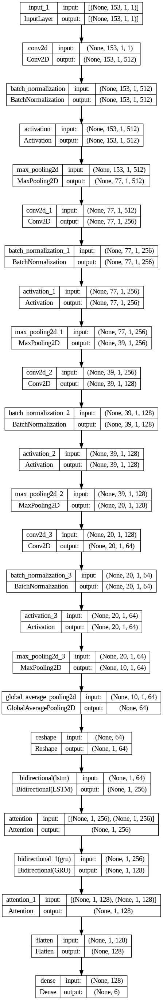

In [ ]:
from keras.utils import plot_model

# Model 1
plot_model(model1, to_file='model1.png', show_shapes=True)


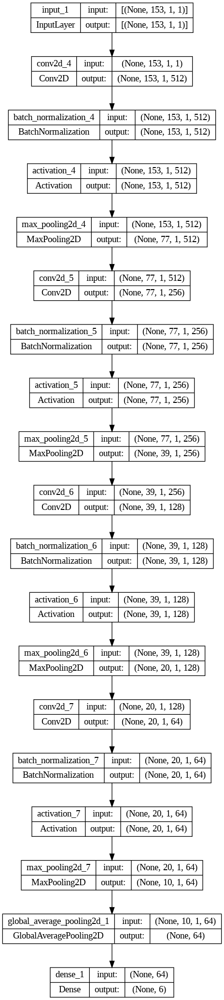

In [ ]:
# Model 2
plot_model(model2, to_file='model2.png', show_shapes=True)


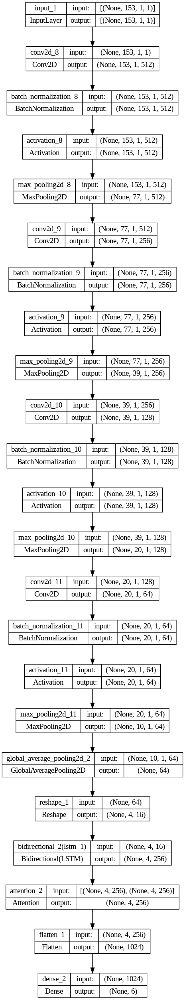

In [ ]:
# Model 3
plot_model(model3, to_file='model3.png', show_shapes=True)


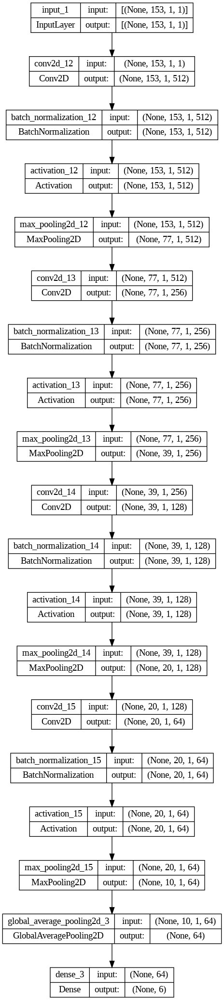

In [ ]:
# Model 4
plot_model(model4, to_file='model4.png', show_shapes=True)

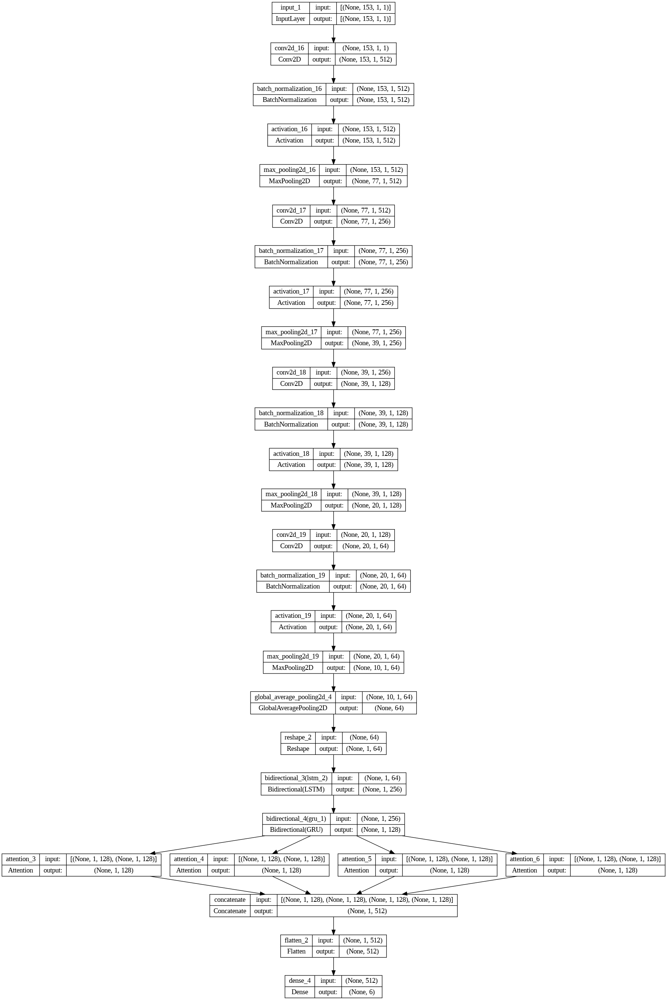

In [ ]:
# Model 5
plot_model(model5, to_file='model5.png', show_shapes=True)

# Evaluation Metrics

494/494 [==============================] - 3s 6ms/step - loss: 0.2185 - accuracy: 0.9358
Accuracy of Model model1 on test data: 93.57757568359375%


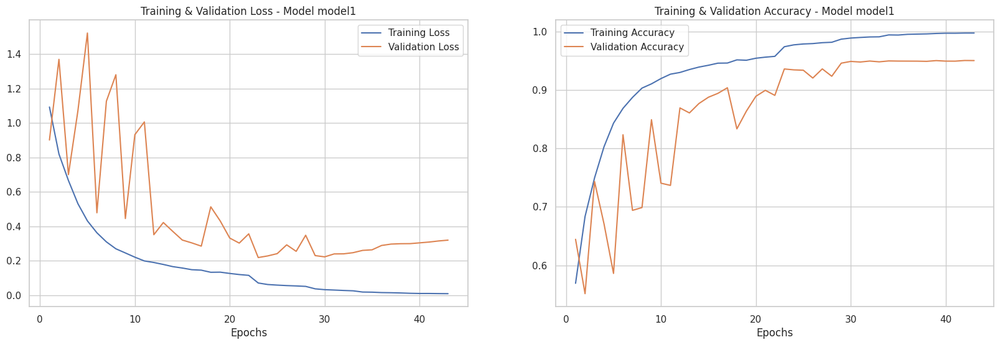

494/494 [==============================] - 3s 5ms/step - loss: 0.1828 - accuracy: 0.9484
Accuracy of Model model2 on test data: 94.83674764633179%


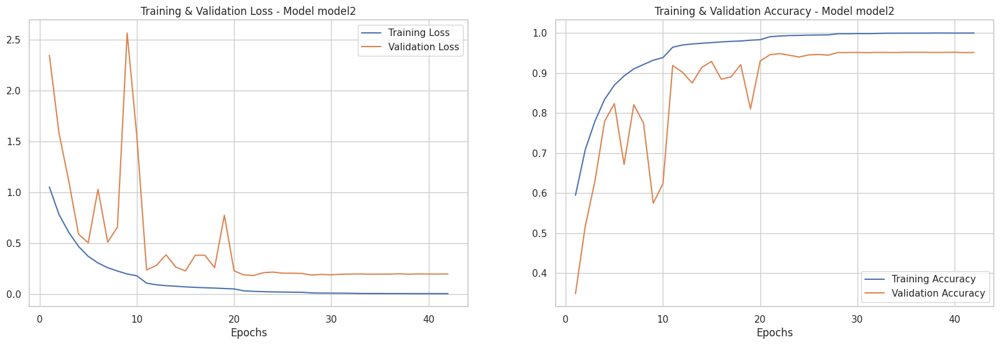

494/494 [==============================] - 3s 6ms/step - loss: 0.2018 - accuracy: 0.9458
Accuracy of Model model3 on test data: 94.58364844322205%


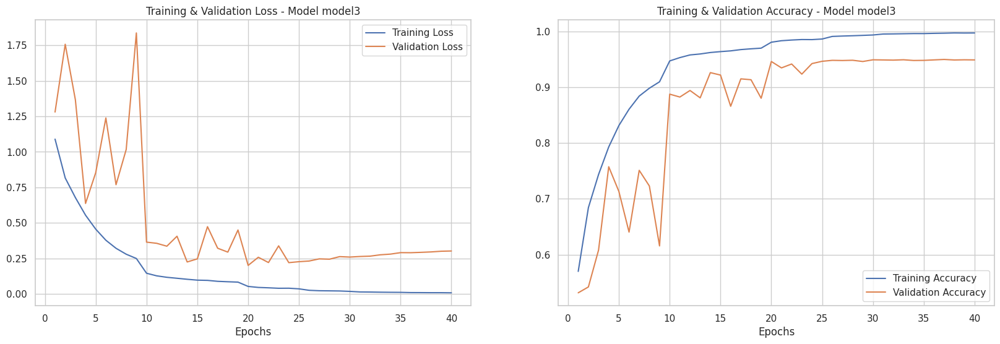

494/494 [==============================] - 3s 6ms/step - loss: 0.1903 - accuracy: 0.9505
Accuracy of Model model4 on test data: 95.05188465118408%


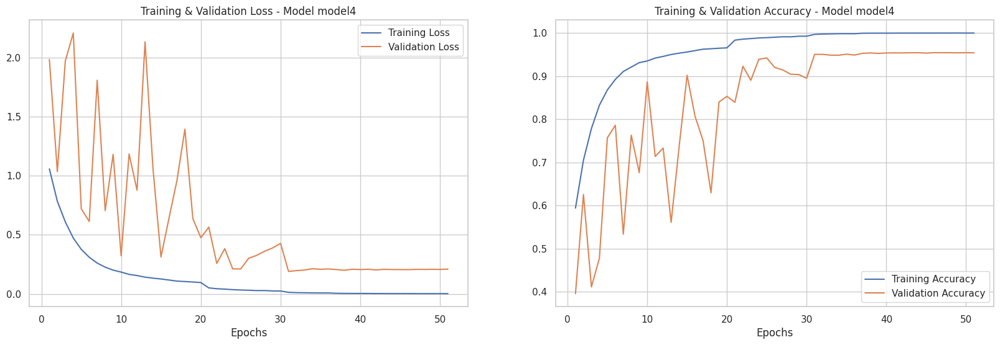

494/494 [==============================] - 3s 6ms/step - loss: 0.2013 - accuracy: 0.9461
Accuracy of Model model5 on test data: 94.60896253585815%


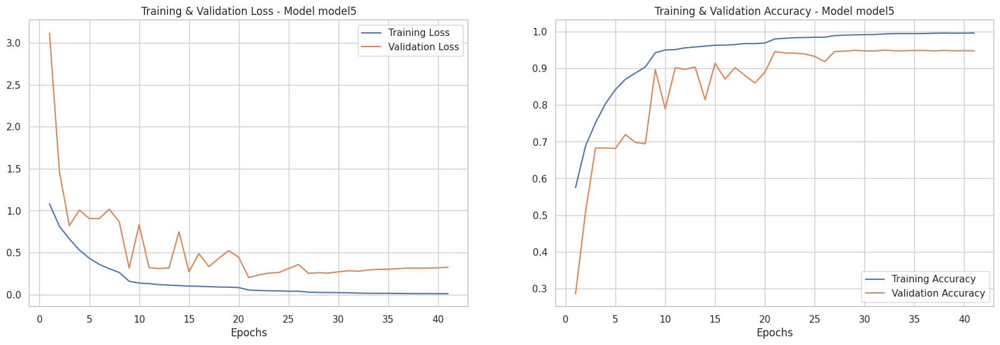

In [ ]:
import matplotlib.pyplot as plt

for i, model in enumerate(models):
    # Evaluate the model on the test set and print accuracy
    accuracy = model.evaluate(X_test, y_test)[1] * 100
    print(f'Accuracy of Model {model_names[i]} on test data: {accuracy}%')

    # Generate training and validation loss/accuracy plots
    history = histories[i]  # Access the correct history for the current model
    actual_epochs = len(history.history['loss'])  #  history is a list for different models
    epochs = [i for i in range(1, actual_epochs + 1)]  # Start epochs from 1
    fig, ax = plt.subplots(1, 2)

    train_acc = history.history['accuracy']  # Use 'accuracy'
    train_loss = history.history['loss']
    val_acc = history.history['val_accuracy']  # Use 'val_accuracy'
    val_loss = history.history['val_loss']

    fig.set_size_inches(20, 6)
    ax[0].plot(epochs, train_loss, label='Training Loss')
    ax[0].plot(epochs, val_loss, label='Validation Loss')
    ax[0].set_title(f'Training & Validation Loss - Model {model_names[i]}')
    ax[0].legend()
    ax[0].set_xlabel("Epochs")

    ax[1].plot(epochs, train_acc, label='Training Accuracy')
    ax[1].plot(epochs, val_acc, label='Validation Accuracy')
    ax[1].set_title(f'Training & Validation Accuracy - Model {model_names[i]}')
    ax[1].legend()
    ax[1].set_xlabel("Epochs")
    plt.show()


494/494 [==============================] - 4s 5ms/step


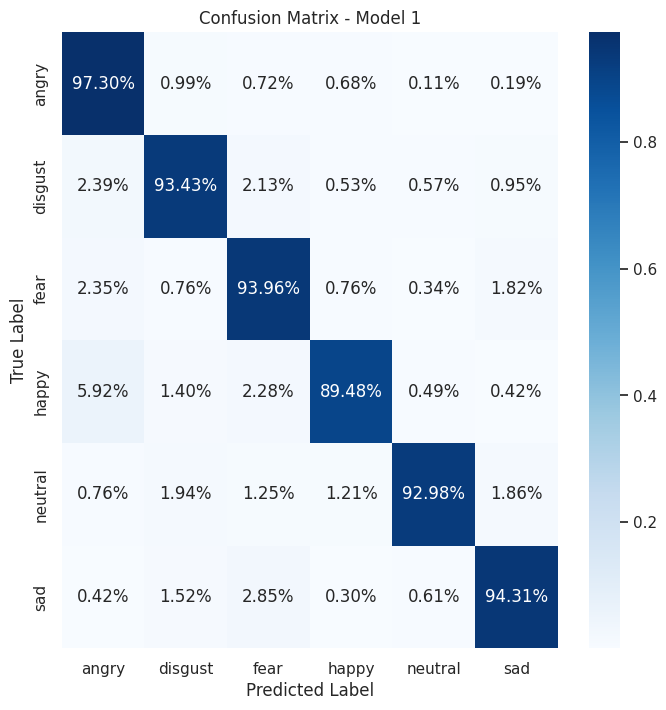

494/494 [==============================] - 2s 4ms/step


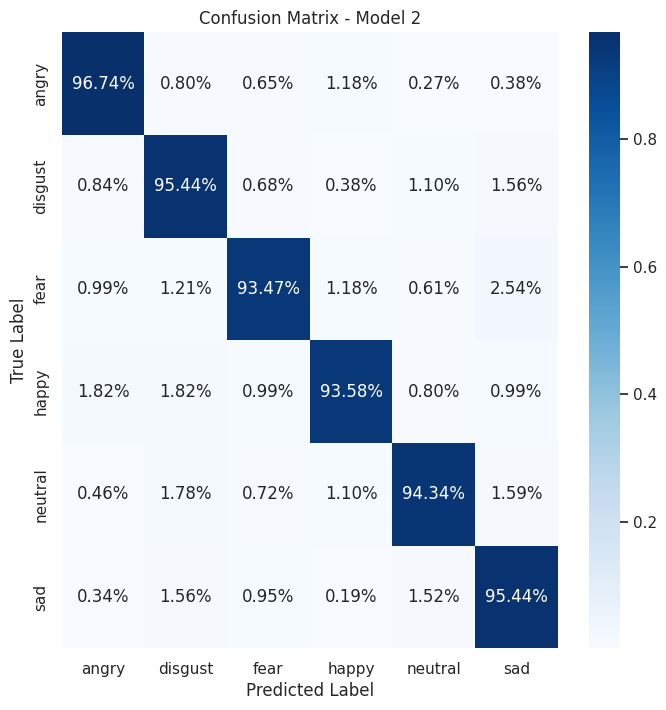

494/494 [==============================] - 4s 5ms/step


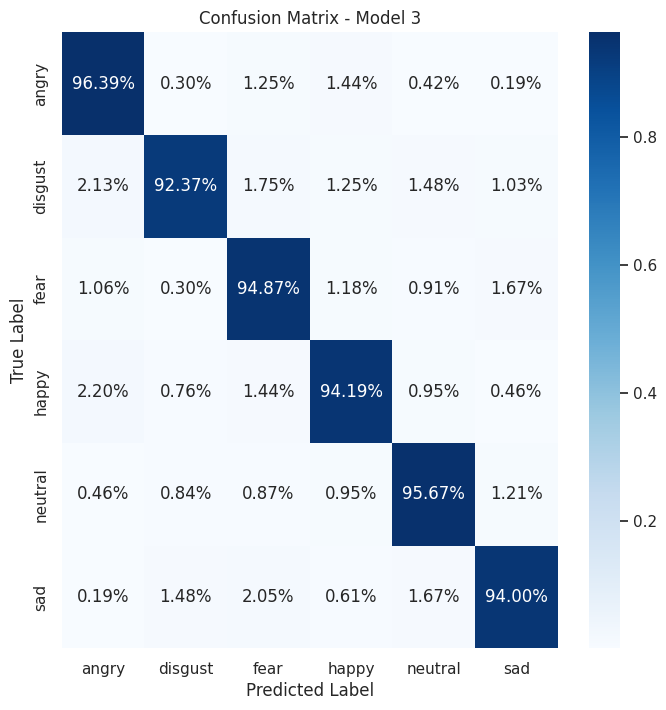

494/494 [==============================] - 2s 4ms/step


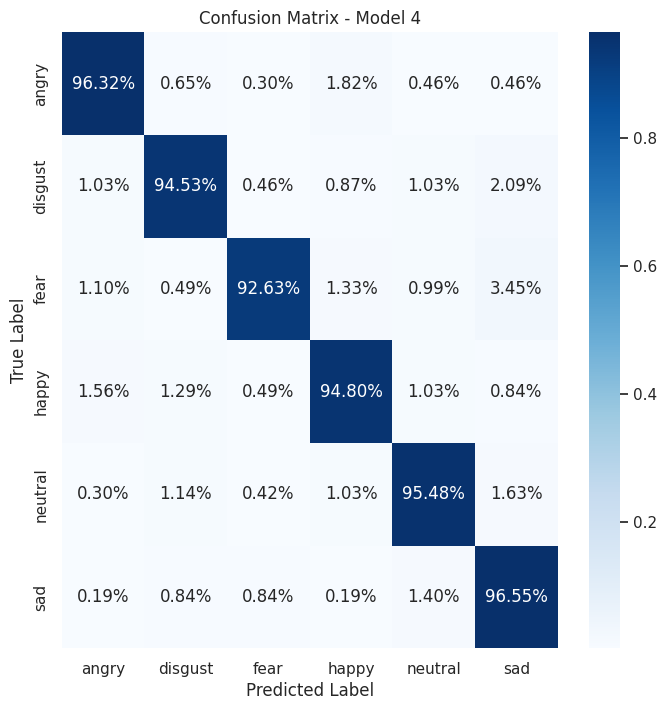

494/494 [==============================] - 4s 5ms/step


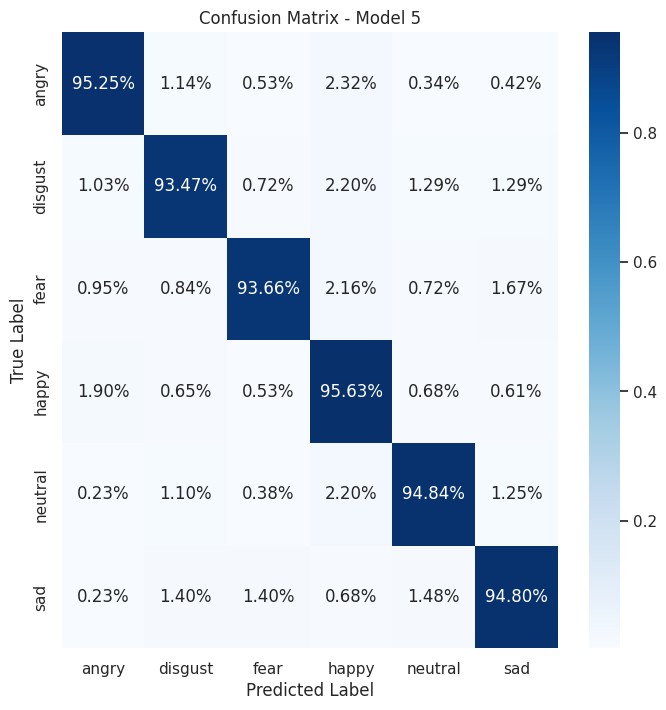

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Define a mapping of integer labels to emotion names
label_to_emotion = {0: 'angry', 1: 'disgust', 2: 'fear', 3: 'happy', 4: 'neutral', 5: 'sad'}

# Iterate over each model
for i, model in enumerate(models):
    # Get the model's predictions
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)

    # Get the actual classes
    y_true = np.argmax(y_test, axis=1)

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred_classes)

    # Convert actual counts to percentages
    cm_percent = cm / cm.sum(axis=1).reshape(-1, 1)

    # Plot confusion matrix with emotion labels and percentages
    plt.figure(figsize=(8, 8))
    sns.heatmap(cm_percent, annot=True, fmt='.2%', cmap='Blues', xticklabels=label_to_emotion.values(), yticklabels=label_to_emotion.values())
    plt.title(f'Confusion Matrix - Model {i+1}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

494/494 [==============================] - 2s 5ms/step


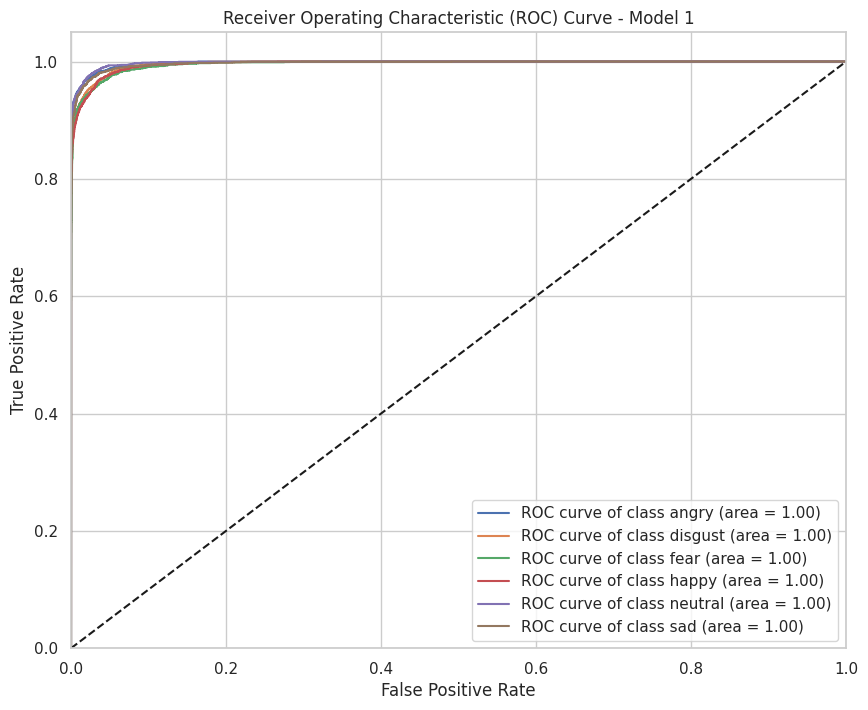

494/494 [==============================] - 2s 4ms/step


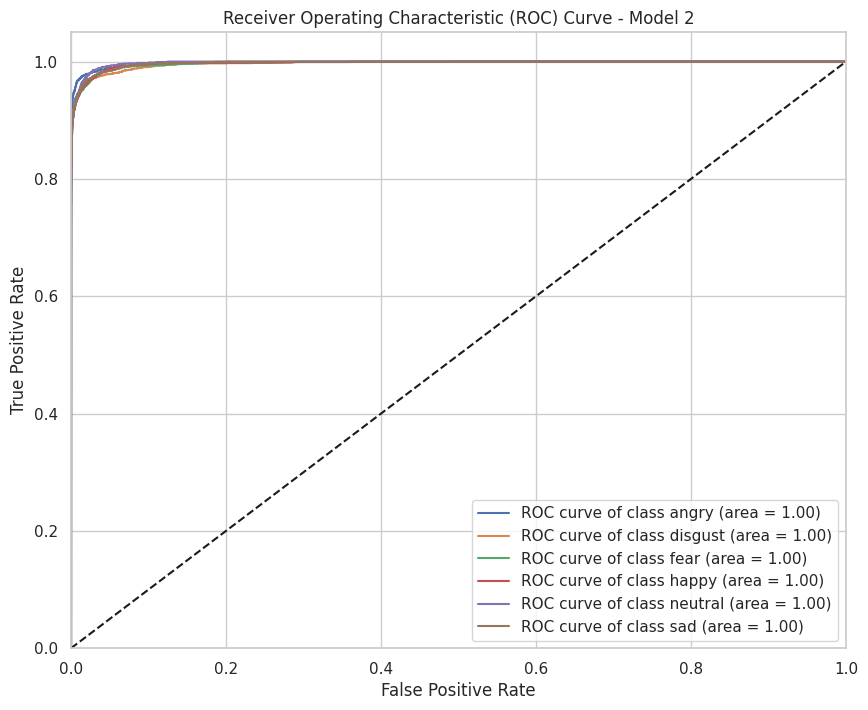

494/494 [==============================] - 2s 5ms/step


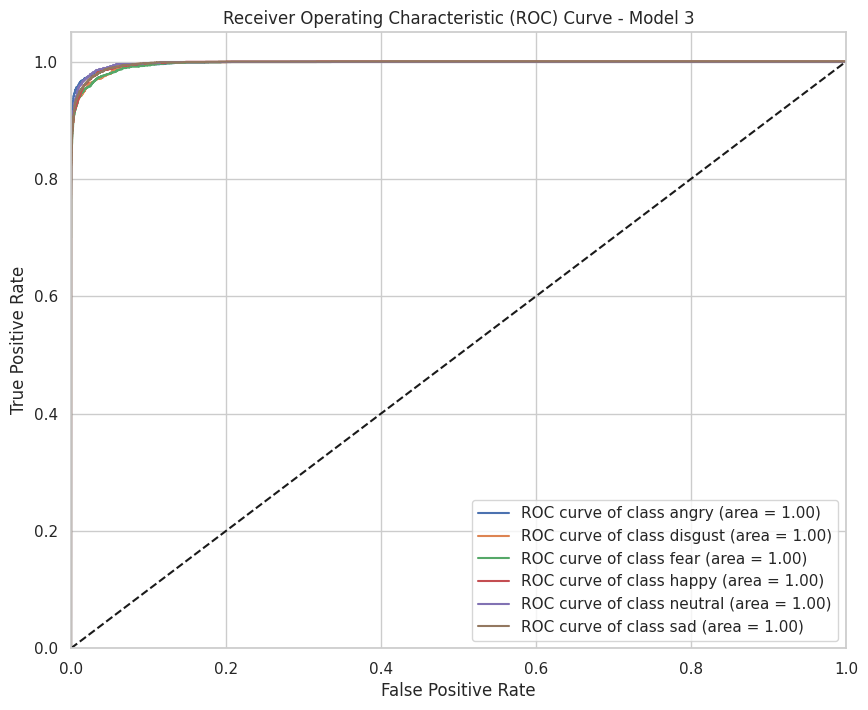

494/494 [==============================] - 2s 4ms/step


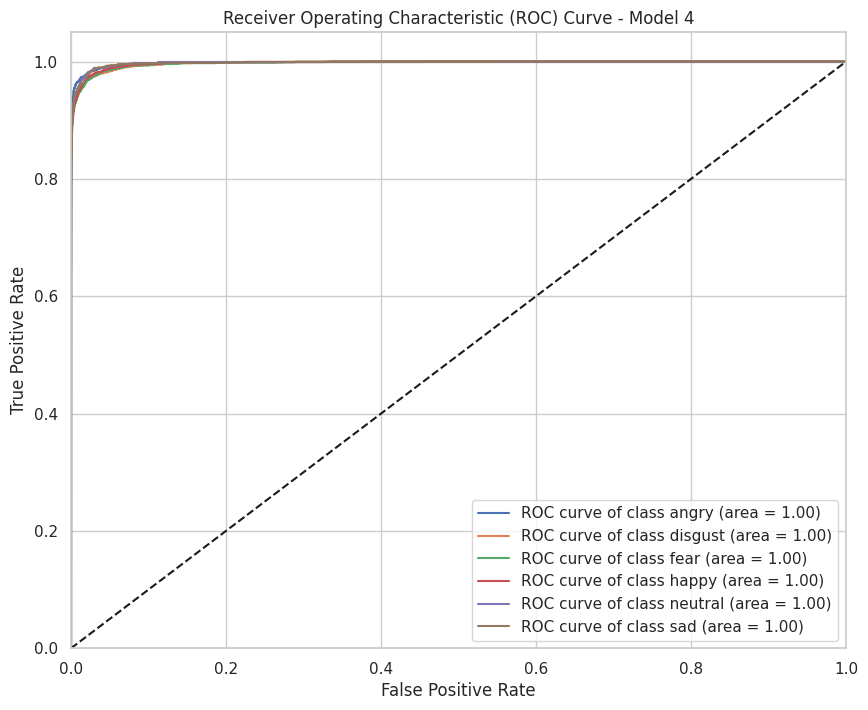

494/494 [==============================] - 2s 5ms/step


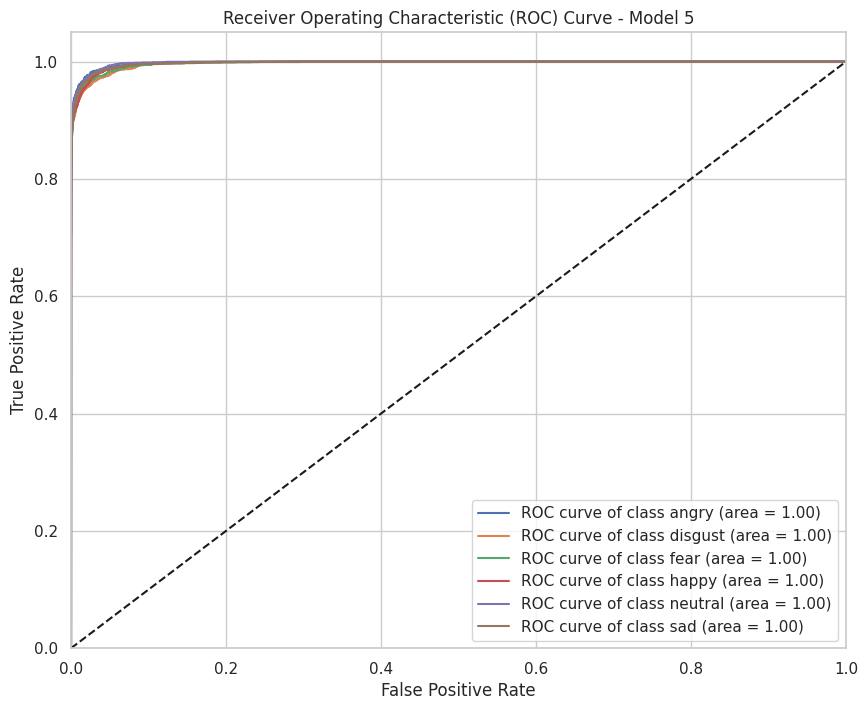

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Define the emotion labels
label_to_emotion = {0: 'angry', 1: 'disgust', 2: 'fear', 3: 'happy', 4: 'neutral', 5: 'sad'}

# Iterate over each model
for i, model in enumerate(models):
    # Get the model's predictions
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)

    # Get the actual classes
    y_true = np.argmax(y_test, axis=1)

    # Binarize the labels for ROC curve
    y_test_bin = label_binarize(y_true, classes=[0, 1, 2, 3, 4, 5])
    y_pred_bin = model.predict(X_test)

    n_classes = y_test_bin.shape[1]

    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for j in range(n_classes):
        fpr[j], tpr[j], _ = roc_curve(y_test_bin[:, j], y_pred_bin[:, j])
        roc_auc[j] = auc(fpr[j], tpr[j])

    # Plot ROC curves
    plt.figure(figsize=(10, 8))

    for j in range(n_classes):
        plt.plot(fpr[j], tpr[j], label=f'ROC curve of class {label_to_emotion[j]} (area = {roc_auc[j]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic (ROC) Curve - Model {i+1}')
    plt.legend(loc="lower right")

    plt.show()

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Define a mapping of integer labels to emotion names
label_to_emotion = {0: 'angry', 1: 'disgust', 2: 'fear', 3: 'happy', 4: 'neutral', 5: 'sad'}

# Iterate over each model
for i, model in enumerate(models):
    # Get the model's predictions
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)

    # Get the actual classes
    y_true = np.argmax(y_test, axis=1)

    print(f"Metrics for Model {i+1}:")
    for label in range(6):
        # Calculate metrics for this label
        precision = precision_score(y_true, y_pred_classes, labels=[label], average='micro')
        recall = recall_score(y_true, y_pred_classes, labels=[label], average='micro')
        f1 = f1_score(y_true, y_pred_classes, labels=[label], average='micro')

        # Print classification report for this label
        print(f"Classification report for {label_to_emotion[label]}:")
        print(f"Precision: {precision}")
        print(f"Recall: {recall}")
        print(f"F1-score: {f1}\n")

494/494 [==============================] - 2s 5ms/step
Metrics for Model 1:
Classification report for angry:
Precision: 0.8914782608695652
Recall: 0.9730447987851177
F1-score: 0.9304774006171719

Classification report for disgust:
Precision: 0.933965844402277
Recall: 0.9343204252088079
F1-score: 0.9341431011577149

Classification report for fear:
Precision: 0.9105960264900662
Recall: 0.9396355353075171
F1-score: 0.9248878923766816

Classification report for happy:
Precision: 0.9624336463862802
Recall: 0.8948367501898253
F1-score: 0.9274050757426716

Classification report for neutral:
Precision: 0.9776447105788423
Recall: 0.9297646165527714
F1-score: 0.9531037166763962

Classification report for sad:
Precision: 0.9473684210526315
Recall: 0.9430523917995444
F1-score: 0.9452054794520547

494/494 [==============================] - 2s 4ms/step
Metrics for Model 2:
Classification report for angry:
Precision: 0.9560975609756097
Recall: 0.9673500379650721
F1-score: 0.9616908850726552

Classifi

In [ ]:
from sklearn.metrics import classification_report

# Define a mapping of integer labels to emotion names
label_to_emotion = {0: 'angry', 1: 'disgust', 2: 'fear', 3: 'happy', 4: 'neutral', 5: 'sad'}

# Iterate over each model
for i, model in enumerate(models):
    # Get the model's predictions
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)

    # Get the actual classes
    y_true = np.argmax(y_test, axis=1)

    print(f"Classification report for Model {i+1}:")
    print(classification_report(y_true, y_pred_classes, target_names=label_to_emotion.values()))

494/494 [==============================] - 2s 5ms/step
Classification report for Model 1:
              precision    recall  f1-score   support

       angry       0.89      0.97      0.93      2634
     disgust       0.93      0.93      0.93      2634
        fear       0.91      0.94      0.92      2634
       happy       0.96      0.89      0.93      2634
     neutral       0.98      0.93      0.95      2634
         sad       0.95      0.94      0.95      2634

    accuracy                           0.94     15804
   macro avg       0.94      0.94      0.94     15804
weighted avg       0.94      0.94      0.94     15804

494/494 [==============================] - 2s 4ms/step
Classification report for Model 2:
              precision    recall  f1-score   support

       angry       0.96      0.97      0.96      2634
     disgust       0.93      0.95      0.94      2634
        fear       0.96      0.93      0.95      2634
       happy       0.96      0.94      0.95      2634
     n

In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Define a list to store the most and least correctly predicted emotions for each model
models_most_correct_emotion = []
models_least_correct_emotion = []

for model in models:  # 'models' is the list of  models
    # Get the model's predictions
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)

    # Get the actual classes
    y_true = np.argmax(y_test, axis=1)

    # Generate classification report
    report = classification_report(y_true, y_pred_classes, output_dict=True)

    # Define a mapping of integer labels to emotion names
    label_to_emotion = {0: 'angry', 1: 'disgust', 2: 'fear', 3: 'happy', 4: 'neutral', 5: 'sad'}

    # Find out which emotion was most correctly predicted and which was least correctly predicted
    emotion_labels = [0, 1, 2, 3, 4, 5]
    f1_scores = [report[str(label)]['f1-score'] for label in emotion_labels]

    most_correct_emotion = label_to_emotion[emotion_labels[np.argmax(f1_scores)]]
    least_correct_emotion = label_to_emotion[emotion_labels[np.argmin(f1_scores)]]

    models_most_correct_emotion.append(most_correct_emotion)
    models_least_correct_emotion.append(least_correct_emotion)

# Print the most and least correctly predicted emotions for each model
for i, model in enumerate(models):
    print(f"Model {i+1}:")
    print(f"The emotion most correctly predicted is: {models_most_correct_emotion[i]}")
    print(f"The emotion least correctly predicted is: {models_least_correct_emotion[i]}")
    print()

494/494 [==============================] - 2s 5ms/step
Model 1:
The emotion most correctly predicted is: neutral
The emotion least correctly predicted is: fear

Model 2:
The emotion most correctly predicted is: angry
The emotion least correctly predicted is: disgust

Model 3:
The emotion most correctly predicted is: angry
The emotion least correctly predicted is: fear

Model 4:
The emotion most correctly predicted is: angry
The emotion least correctly predicted is: sad

Model 5:
The emotion most correctly predicted is: angry
The emotion least correctly predicted is: happy



In [ ]:
# Define lists to store metrics for each model and emotion
precisions = []
recalls = []
f1_scores = []

# Iterate over each model
for i, model in enumerate(models):
    # Get the model's predictions
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)

    # Get the actual classes
    y_true = np.argmax(y_test, axis=1)

    # Calculate metrics for each label
    precision_scores = []
    recall_scores = []
    f1_scores_model = []
    for label in range(6):
        precision = precision_score(y_true, y_pred_classes, labels=[label], average='micro')
        recall = recall_score(y_true, y_pred_classes, labels=[label], average='micro')
        f1 = f1_score(y_true, y_pred_classes, labels=[label], average='micro')

        precision_scores.append(precision)
        recall_scores.append(recall)
        f1_scores_model.append(f1)

    # Store the metrics for this model
    precisions.append(precision_scores)
    recalls.append(recall_scores)
    f1_scores.append(f1_scores_model)

# Print each metric for each model
labels = list(label_to_emotion.values())

for i, (precision, recall, f1) in enumerate(zip(precisions, recalls, f1_scores)):
    print(f"Metrics for Model {i+1}:")
    for label, p, r, f in zip(labels, precision, recall, f1):
        print(f"Classification report for {label}:")
        print(f"Precision: {p}")
        print(f"Recall: {r}")
        print(f"F1-score: {f}\n")

# Find the overall best model based on the highest average scores across emotions
avg_precision = np.mean(precisions, axis=0)
avg_recall = np.mean(recalls, axis=0)
avg_f1 = np.mean(f1_scores, axis=0)

# Print the overall metrics
print("Overall Metrics:")
for label, p, r, f in zip(labels, avg_precision, avg_recall, avg_f1):
    print(f"Classification report for {label}:")
    print(f"Average Precision: {p}")
    print(f"Average Recall: {r}")
    print(f"Average F1-score: {f}\n")

494/494 [==============================] - 2s 5ms/step
Metrics for Model 1:
Classification report for angry:
Precision: 0.8914782608695652
Recall: 0.9730447987851177
F1-score: 0.9304774006171719

Classification report for disgust:
Precision: 0.933965844402277
Recall: 0.9343204252088079
F1-score: 0.9341431011577149

Classification report for fear:
Precision: 0.9105960264900662
Recall: 0.9396355353075171
F1-score: 0.9248878923766816

Classification report for happy:
Precision: 0.9624336463862802
Recall: 0.8948367501898253
F1-score: 0.9274050757426716

Classification report for neutral:
Precision: 0.9776447105788423
Recall: 0.9297646165527714
F1-score: 0.9531037166763962

Classification report for sad:
Precision: 0.9473684210526315
Recall: 0.9430523917995444
F1-score: 0.9452054794520547

Metrics for Model 2:
Classification report for angry:
Precision: 0.9560975609756097
Recall: 0.9673500379650721
F1-score: 0.9616908850726552

Classification report for disgust:
Precision: 0.93007769145394


In [ ]:
from sklearn.metrics import accuracy_score

for i, model in enumerate(models):
    model_predictions = model.predict(X_test)
    model_accuracy = accuracy_score(np.argmax(y_test, axis=1), np.argmax(model_predictions, axis=1))
    print(f'Model {i+1} Accuracy: {model_accuracy * 100}%')

494/494 [==============================] - 2s 5ms/step
Model 1 Accuracy: 93.57757529739307%
494/494 [==============================] - 2s 4ms/step
Model 2 Accuracy: 94.83675018982535%
494/494 [==============================] - 2s 5ms/step
Model 3 Accuracy: 94.58364970893444%
494/494 [==============================] - 2s 4ms/step
Model 4 Accuracy: 95.05188559858264%
494/494 [==============================] - 2s 5ms/step
Model 5 Accuracy: 94.60895975702354%


In [ ]:
for i, model in enumerate(models):
    # Evaluate the model on the test set and print accuracy
    accuracy = model.evaluate(X_test, y_test)[1] * 100
    print(f'Accuracy of Model {model_names[i]} on test data: {accuracy}%')

    # Print the validation loss
    val_loss = histories[i].history['val_loss']
    print(f'Validation Loss of Model {model_names[i]}: {val_loss}')

494/494 [==============================] - 3s 6ms/step - loss: 0.2185 - accuracy: 0.9358
Accuracy of Model model1 on test data: 93.57757568359375%
Validation Loss of Model model1: [0.900765597820282, 1.3689676523208618, 0.6998139023780823, 1.0710866451263428, 1.5216591358184814, 0.47840994596481323, 1.1260141134262085, 1.2796900272369385, 0.44504812359809875, 0.9316738843917847, 1.005699872970581, 0.3510951101779938, 0.42180702090263367, 0.3701428472995758, 0.3201494514942169, 0.3035806119441986, 0.2847632169723511, 0.5130136609077454, 0.4304291903972626, 0.33156096935272217, 0.3024071455001831, 0.35609906911849976, 0.21852512657642365, 0.22797271609306335, 0.24120263755321503, 0.29222872853279114, 0.25457069277763367, 0.3479365408420563, 0.22989286482334137, 0.22255541384220123, 0.23954683542251587, 0.24005725979804993, 0.24680915474891663, 0.26008814573287964, 0.26347479224205017, 0.2886480689048767, 0.29665717482566833, 0.2988447844982147, 0.2992442548274994, 0.3038305938243866, 0.3

In [ ]:
for i, model in enumerate(models):
    # Evaluate the model on the test set and print accuracy
    accuracy = model.evaluate(X_test, y_test)[1] * 100
    print(f'Accuracy of Model {model_names[i]} on test data: {accuracy}%')

    # Find the minimum validation loss and its epoch number
    val_loss = histories[i].history['val_loss']
    min_val_loss = min(val_loss)
    min_val_loss_epoch = val_loss.index(min_val_loss) + 1

    print(f'Best Validation Loss of Model {model_names[i]}: {min_val_loss} at epoch {min_val_loss_epoch}')

494/494 [==============================] - 3s 6ms/step - loss: 0.2185 - accuracy: 0.9358
Accuracy of Model model1 on test data: 93.57757568359375%
Best Validation Loss of Model model1: 0.21852512657642365 at epoch 23
494/494 [==============================] - 3s 6ms/step - loss: 0.1828 - accuracy: 0.9484
Accuracy of Model model2 on test data: 94.83674764633179%
Best Validation Loss of Model model2: 0.18282531201839447 at epoch 22
494/494 [==============================] - 3s 6ms/step - loss: 0.2018 - accuracy: 0.9458
Accuracy of Model model3 on test data: 94.58364844322205%
Best Validation Loss of Model model3: 0.20183207094669342 at epoch 20
494/494 [==============================] - 3s 6ms/step - loss: 0.1903 - accuracy: 0.9505
Accuracy of Model model4 on test data: 95.05188465118408%
Best Validation Loss of Model model4: 0.1903025358915329 at epoch 31
494/494 [==============================] - 3s 6ms/step - loss: 0.2013 - accuracy: 0.9461
Accuracy of Model model5 on test data: 94.60

In [ ]:
import numpy as np

#  you have models model1, model2, ..., model5
models = [model1, model2, model3, model4, model5]

# Predict probabilities for each model
probabilities = [model.predict(X_test) for model in models]

# Average the predicted probabilities
average_probabilities = np.mean(probabilities, axis=0)

# Convert probabilities to class predictions
ensemble_predictions = np.argmax(average_probabilities, axis=1)

# Evaluate the ensemble accuracy
ensemble_accuracy = accuracy_score(np.argmax(y_test, axis=1), ensemble_predictions)
print(f'Ensemble Accuracy (Averaging): {ensemble_accuracy * 100}%')

494/494 [==============================] - 4s 5ms/step
Ensemble Accuracy (Averaging): 96.00733991394583%


In [ ]:
#  'model' trained model and 'X_test', 'y_test' are  test data
predictions = model.predict(X_test)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_test, axis=1)

misclassified_indices = np.where(predicted_labels != true_labels)[0]

for idx in misclassified_indices:
    true_label = label_to_emotion[true_labels[idx]]
    predicted_label = label_to_emotion[predicted_labels[idx]]
    print(f"Sample {idx + 1}: True Label - {true_label}, Predicted Label - {predicted_label}")
    # You can also display or save these misclassified samples for further analysis


494/494 [==============================] - 2s 5ms/step
Sample 64: True Label - sad, Predicted Label - neutral
Sample 72: True Label - fear, Predicted Label - happy
Sample 133: True Label - happy, Predicted Label - angry
Sample 158: True Label - sad, Predicted Label - neutral
Sample 176: True Label - disgust, Predicted Label - sad
Sample 195: True Label - angry, Predicted Label - disgust
Sample 201: True Label - angry, Predicted Label - happy
Sample 209: True Label - disgust, Predicted Label - neutral
Sample 210: True Label - sad, Predicted Label - neutral
Sample 216: True Label - disgust, Predicted Label - happy
Sample 228: True Label - disgust, Predicted Label - sad
Sample 236: True Label - neutral, Predicted Label - disgust
Sample 259: True Label - fear, Predicted Label - happy
Sample 283: True Label - disgust, Predicted Label - happy
Sample 290: True Label - disgust, Predicted Label - happy
Sample 294: True Label - disgust, Predicted Label - neutral
Sample 298: True Label - sad, Pre

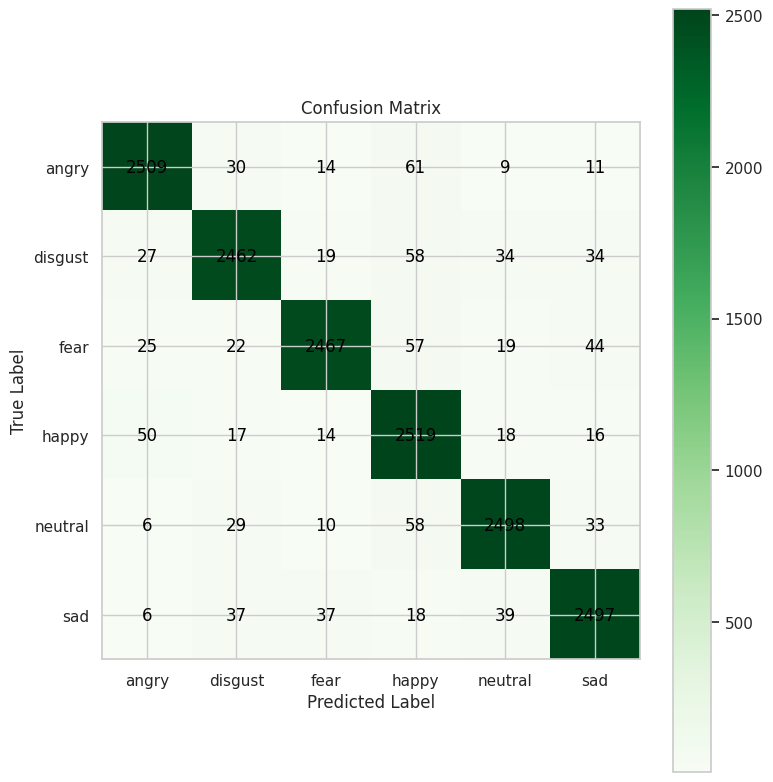

In [ ]:
# Define a mapping of integer labels to emotion names
label_to_emotion = {0: 'angry', 1: 'disgust', 2: 'fear', 3: 'happy', 4: 'neutral', 5: 'sad'}

# Calculate the confusion matrix
confusion = confusion_matrix(true_labels, predicted_labels)

# Plot the confusion matrix
fig, ax = plt.subplots(figsize=(8, 8))
im = ax.imshow(confusion, interpolation='nearest', cmap=plt.cm.Greens)  # lighter colormap
ax.figure.colorbar(im, ax=ax)

# Set labels, ticks, and title
ax.set(xticks=np.arange(confusion.shape[1]),
       yticks=np.arange(confusion.shape[0]),
       xticklabels=[label_to_emotion[i] for i in range(confusion.shape[1])],  # include emotion labels
       yticklabels=[label_to_emotion[i] for i in range(confusion.shape[0])],  # include emotion labels
       title='Confusion Matrix',
       ylabel='True Label',
       xlabel='Predicted Label')

# Loop over the data and create text annotations for counts
for i in range(confusion.shape[0]):
    for j in range(confusion.shape[1]):
        ax.text(j, i, str(confusion[i, j]), ha="center", va="center", color="black")  # set text color to black

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
# Calculate the misclassified samples per emotion class
misclassified_counts = {}
for idx in misclassified_indices:
    true_label = label_to_emotion[true_labels[idx]]
    predicted_label = label_to_emotion[predicted_labels[idx]]
    misclassified_counts[true_label] = misclassified_counts.get(true_label, 0) + 1

# Calculate the percentage of misclassification for each emotion class
total_samples = len(true_labels)
misclassification_percentages = {emotion: (misclassified_counts[emotion] / total_samples) * 100 for emotion in misclassified_counts}

# Print the percentage of misclassification for each emotion class
for emotion, percentage in misclassification_percentages.items():
    print(f"{emotion}: {percentage:.1f}%")

sad: 0.9%
fear: 1.1%
happy: 0.7%
disgust: 1.1%
angry: 0.8%
neutral: 0.9%


In [ ]:
from scipy.stats import pearsonr

# Calculate the Pearson correlation coefficient
corr, _ = pearsonr(y_pred_classes, y_true)

# Print the correlation coefficient
print("Pearson correlation coefficient:", corr)

Pearson correlation coefficient: 0.9443695490654593
